In [1]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
%matplotlib inline
import statsmodels.formula.api as smf
import geopandas as gpd

# Target: measure the relationship between the change of housing rent price and entropy index of income_level groups

# DataFrames:
- df_PUMA: the PUMA list, incuding the code, community districts and the neighborhoods' names

- df: cleaned dataset
- df_all: all origin variables, combining dataset and PUMA information


- df_census_entropy: entropy index for 2089 census tracts
- df_puma_entropy: entropy index for 55 PUMAs



all useful variables except entropy index, including rent, income, rent growth, income growth, rent-income-ratio:
- df2: , at census tract level
- df_puma_median, at puma level, the median value of the census tracts in each PUMA


**all useful variables for analysis**, above + entropy index + entropy index change:
- **df_census_analysis** 
- **df_puma_analysis**


entropy and rent, **for regression**:
- **df_census_entropy_rent**
- **df_puma_entropy_rent**








# 1.Data cleaning

# 1.1 clean dataset
This dataset is exported from Geolytics: Neighborhood Change Database (NACD)
(http://demographics.geolytics.com/ncdb2010/default.aspx)


### the dataset has been uploaded on:
 https://github.com/picniclin/NYC_yl5240/blob/master/geolytics_NYC_census_1990-2010.csv
 
or
https://drive.google.com/a/nyu.edu/file/d/0B2HY61hRpF-jV21KSTVsbi1wS3M/view?usp=sharing

In [ ]:
df = pd.read_csv('https://raw.githubusercontent.com/picniclin/NYC_yl5240/master/geolytics_NYC_census_1990-2010.csv')

In [ ]:
df.shape

In [ ]:
df.head()

In [ ]:
# check the columns names
# list(df.columns)

## make the column names readable

In [ ]:
df.columns

In [ ]:
cols = df.columns.str.replace('TRCTPOP', 'pop')\
            .str.replace('MDFAMY','median_inc_fam_')\
            .str.replace('FAVINC', 'ave_inc_fam_')\
            .str.replace('MDHHY', 'median_inc_hh_')\
            .str.replace('AVHHIN', 'ave_inc_hh_')\
            .str.replace('FALTY', 'fam_inc_')\
            .str.replace('FALT', 'fam_inc_')\
            .str.replace('MXB', 'max_')\
            .str.replace('FAY0', 'fam_inc_')\
            .str.replace('fam_inc_M', 'fam_inc_max_')\
            .str.replace('THY0', 'hh_inc_' )\
            .str.replace('hh_inc_M', 'hh_inc_max_')\
            .str.replace('MDVALHS','median_house_value_')\
            .str.replace('MDGRENT', 'median_rent_' )\
            .str.replace('MCSMORT', 'owner_cost_mo_' )\
            .str.replace('MCSNMOR', 'owner_cost_no_mo_' )\
            .str.replace('OCCHU', 'occ_')\
            .str.replace('VACHU', 'vacant_')\
            .str.replace('RNTOCC','renter_occ_')\
            .str.replace('OWNOCC', 'owner_occ_')\
            .str.replace('SPRNTOC', 'spec_renter_occ_')\
            .str.replace('SPOWNOC', 'spec_owner_occ_')\
            .str.replace('PRSOCU', 'person_occ_')\
            .str.replace('PRSOWNU', 'person_owner_occ_')\
            .str.replace('PRSRNTU', 'person_renter_occ_')\
            .str.replace('POVRAT','poverty')\
            .str.replace('1A', '1')\
            .str.replace('9A', '9')\
            
cols

In [ ]:
df.columns = cols

In [ ]:
df.head()

In [ ]:
df.columns = cols

df.rename(columns = {'AREAKEY' : 'census_tract',
                     'STATE':'state','STUSAB':'abb.',
                     'TCH_90_10':'tract_change_90', 'TCH_00_10':'tract_change_00',
                    'INTPTLAT':'lat', 'INTPTLON':'lon'}, inplace = True)
df.columns

In [ ]:
df = df.dropna()
df.ZCTA5 = df.ZCTA5.astype('int')
df.shape

In [ ]:
## delete the observation, i.e. census tract, with 0 median rent or 0 median families income
df = df[~((df.median_rent_0 == 0)| (df.median_rent_9 == 0)|(df.median_rent_1 == 0)|\
         (df.median_inc_fam_9 == 0)| (df.median_inc_fam_9 == 0)|(df.median_inc_fam_1 == 0))]
## drop the redundant columns
df.drop(['state', 'abb.','tract_change_90','tract_change_00'], axis = 1, inplace = True)
df.head()

In [ ]:
df.shape

## 1.2 find the PUMA, NAT information for each census tract

### the CensusTract/NTA/PUMA Equivalencies table could be found on this [link](https://www1.nyc.gov/site/planning/data-maps/nyc-population/geographic-reference.page)
 the downloaded linkage is https://www1.nyc.gov/assets/planning/download/office/data-maps/nyc-population/census2010/nyc2010census_tabulation_equiv.xlsx
 
This xlsx includes two tables. Split it into two csv by excel.

And we extract the neighborhoods' names of each PUMA from the xlsx table from NYC DOP's ACS table:http://www1.nyc.gov/site/planning/data-maps/nyc-population/american-community-survey.page

### The three csv files have been uploaded on:
https://github.com/picniclin/NYC_yl5240
- 2010CensusTract_PUMA_NTA.csv
- 2010PUMA_NTA.csv
- PUMA_neighborhoods.csv



In [ ]:
df_conv1 = pd.read_csv('https://raw.githubusercontent.com/picniclin/NYC_yl5240/master/2010CensusTract_PUMA_NTA.csv')
df_conv2 = pd.read_csv('https://raw.githubusercontent.com/picniclin/NYC_yl5240/master/2010PUMA_NTA.csv')
df_conv3 = pd.read_csv('https://raw.githubusercontent.com/picniclin/NYC_yl5240/master/PUMA_neighborhoods.csv')

In [ ]:
## df_conv1 is the conversion table between census tract and PUMA/NTA
df_conv1.head()

In [ ]:
## df_conv2 is the conversion table between PUMA and NTA
df_conv2.head()

In [ ]:
## df_conv3 is the neighborhoods'names for each PUMA
df_conv3.head()

In [ ]:
len(df_conv1), len(df_conv2), len(df_conv3)

In [ ]:
df_conv2.rename(columns = {'PUMA_CommunityDistrict \r':'PUMA_CommunityDistrict'}, inplace=True)

In [ ]:
def abb_rep(x):
    if x.startswith('BX'):
        x = x.replace('BX','Bronx')
    if x.startswith('BK'):
        x = x.replace('BK','Brooklyn')
    if x.startswith('MN'):
        x = x.replace('MN','Manhattan')
    if x.startswith('QN'):
        x = x.replace('QN','Queens')
    if x.startswith('SI'):
        x = x.replace('SI','Staten Island')
    return x
        
df_conv2.PUMA_CommunityDistrict = df_conv2.PUMA_CommunityDistrict.apply(lambda x:abb_rep(x))

In [ ]:
df_conv2.head()

In [ ]:
df_conv2_ = df_conv2.iloc[:,1:3].drop_duplicates().reset_index(drop = True)
df_conv2_.PUMA_CommunityDistrict = df_conv2_.PUMA_CommunityDistrict.\
                str.replace('Community Districts', 'Community District')


## the PUMA list: 55 PUMAs

In [ ]:
## In df_conv2_, we could extract the PUMA list, including PUMA code and PUMA_CommunityDistrict
## and combine it with df_conve
df_PUMA = df_conv2_.merge(df_conv3, on = 'PUMA_CommunityDistrict')
df_PUMA

In [ ]:
df_conv4 = pd.DataFrame([['Bronx', '36005'],['Brooklyn','36047'],['Manhattan','36061'], 
              ['Queens','36081'], ['Staten Island', '36085']], columns=['Borough','BroCode'])
df_conv4

In [ ]:
df_conv2.rename(columns = {'PUMA \rCode':'PUMA',  'NTA _Code': 'NTA_Code'}, inplace=True)

In [ ]:
df_tract = df_conv1.merge(df_conv2.rename(columns={'PUMA Code':'PUMA'}), 
               on = ['NTA_Code', 'NTA_Name', 'Borough', 'PUMA']).merge(df_conv4, on = 'Borough')

df_tract.head()

In [ ]:
df_tract['census_tract']  = (df_tract.BroCode +\
                        df_tract['2010CensusTract'].apply(lambda x : str(x).zfill(6))).astype(int)

### the census tract list: 2167 census tracts in NYC 2010

In [ ]:
df_tract.head()

In [ ]:
df_tract = df_tract.iloc[:,[0,-1,2,-3,3,4]]
df_tract.head()

In [ ]:
df_tract.shape

In [ ]:
# check does the conversion table contain all the census tract in dataset df
len(set(df['census_tract']) - set(df_tract['census_tract'])), \
len(set(df_tract['census_tract']) - set(df['census_tract']) ), \
len(set(df['census_tract']))

#### Yes, the conversion table contain all the census tract in dataset df.

## 1.3 conbine the conversion table into dataset, to add the PUMA and NTA information

In [ ]:
df_all = df.merge(df_tract, on = 'census_tract')

df_all.head()

## df_all is a new whole dataset for further clean and analysis

In [ ]:
# change the colomn location of df_cov's colomns
df_all = pd.concat([df_all.iloc[:,[0]], df_all.iloc[:,-5:], df_all.iloc[:,1:-5]], axis = 1)
df_all.head()

In [ ]:
df_all.shape, df.shape

### We have 2089 census tracts for analysis.

# 2. split the dataset into several sub-tables

## 2.1 Geographies data table
according to http://guides.newman.baruch.cuny.edu/nyc_data/nbhoods, New York City neighborhood census data could use Public Use Microdata Areas (PUMAs).


In [ ]:
# the sub-table of census tract information, including census tract id, latitude, longitude, and ZCTA.
# df_dataset_tract is part of df_tract , accrdance with the observations of dataset
# also three more variables than df_tract: lat, lon, ZCTA5 
df_dataset_tract = df_all.iloc[:, :9]
df_dataset_tract.head()

In [ ]:
df_dataset_tract.shape

## 2.2 Tables for different years

In [ ]:
df_1990 = pd.concat([df_all.iloc[:,0:4], df_all.iloc[:, 9:43]],axis =1)
df_2000 = pd.concat([df_all.iloc[:,0:4], df_all.iloc[:, 43:95]],axis =1)
df_2010 = pd.concat([df_all.iloc[:,:4], df_all.iloc[:, 95:]],axis =1)
df_1990.shape, df_2000.shape, df_2010.shape

In [ ]:
df_1990.head(2)

In [ ]:
df_2000.head(2)

In [ ]:
df_2010.head(2)

## 2.3 Income Tables

In [ ]:
# the sub-table of median/avlerage families/households income
df_income = df_all.loc[:,df_all.columns[(df_all.columns == 'census_tract') |\
                                (df_all.columns == 'Borough')|\
                                (df_all.columns == 'PUMA')|\
                                (df_all.columns == 'PUMA_CommunityDistrict')|\
                              (df_all.columns.str.startswith('median_inc_')) |\
                              (df_all.columns.str.startswith('ave_inc_'))]]
df_income.head()  

In [ ]:
df_income.shape

In [ ]:
df_income.describe()

### Since there is no household income in 1990, we prefer to choose family income data as income data

In [ ]:
df_family_income = df_all.loc[:,df_all.columns[(df_all.columns == 'census_tract') | \
                                (df_all.columns == 'Borough')|\
                                (df_all.columns == 'PUMA')|\
                                (df_all.columns == 'PUMA_CommunityDistrict')|\
                                       df_all.columns.str.startswith('fam_inc_')]]
df_family_income.head()

In [ ]:
# the tables of different groups of families income level
df_family_income_1990 = df_family_income.loc[:,
                        df_family_income.columns[(df_family_income.columns == 'census_tract') |\
                                (df_family_income.columns == 'Borough')|\
                                (df_family_income.columns == 'PUMA')|\
                                (df_family_income.columns == 'PUMA_CommunityDistrict')|\
                                                    df_family_income.columns.str.endswith('9')]]

df_family_income_2000 = df_family_income.loc[:,
                        df_family_income.columns[(df_family_income.columns == 'census_tract') |\
                                (df_family_income.columns == 'Borough')|\
                                (df_family_income.columns == 'PUMA')|\
                                (df_family_income.columns == 'PUMA_CommunityDistrict')|\
                                                    df_family_income.columns.str.endswith('0')]]

df_family_income_2010 = df_family_income.loc[:,
                        df_family_income.columns[(df_family_income.columns == 'census_tract') |\
                                (df_family_income.columns == 'Borough')|\
                                (df_family_income.columns == 'PUMA')|\
                                (df_family_income.columns == 'PUMA_CommunityDistrict')|\
                                                    df_family_income.columns.str.endswith('1')]]

 
df_family_income_1990.shape, df_family_income_2000.shape, df_family_income_2010.shape

In [ ]:
df_family_income_1990.head()

## 2.4 Housing tables, including data of house value and rent

In [ ]:
# the sub-table of housing price and rent
df_house = df_all.loc[:,df_all.columns[(df_all.columns == 'census_tract') |\
                                (df_all.columns == 'Borough')|\
                                (df_all.columns == 'PUMA')|\
                                (df_all.columns == 'PUMA_CommunityDistrict')|\
                              (df_all.columns.str.startswith('median_rent_')) |\
                              (df_all.columns.str.startswith('median_house_'))]]
df_house

In [ ]:
df_house.shape

In [ ]:
df_house.describe()

# 3. Analysis based on census tract

## 1）create the table for relationship analysis

The variables we need are median family income, median rent, families with different income level

## Look at a whole view of income and rent
To compare the 1990 data, we choose the family income, not household income.

In [ ]:
df2 = df_all.loc[:,df_all.columns[(df_all.columns == 'census_tract') |\
                                (df_all.columns == 'Borough')|\
                                (df_all.columns == 'PUMA')|\
                                (df_all.columns == 'PUMA_CommunityDistrict')|\
                          (df_all.columns.str.startswith('median_inc_fam'))|\
                          (df_all.columns.str.startswith('median_rent')) ]]

In [ ]:
df2.head()

In [ ]:
df2['rent_income_ratio_9'] = df2['median_rent_9'] * 12/df2['median_inc_fam_9']
df2['rent_income_ratio_0'] = df2['median_rent_0'] * 12/df2['median_inc_fam_0']
df2['rent_income_ratio_1'] = df2['median_rent_1'] * 12/df2['median_inc_fam_1']
df2.shape

In [ ]:
df2['rent_income_ratio_9'].describe()[5]

In [ ]:
ax = df2.rent_income_ratio_9.plot(kind="hist", bins = 10000)
plt.axvline( x = df2['rent_income_ratio_9'].describe()[5], color = 'firebrick', linestyle = '--' )
ax.set_xlim(0,1)
ax.set_xlabel("90'_rent_income_ratio");

In [ ]:
df2['rent_income_ratio_0'].describe()

In [ ]:
ax = df2.rent_income_ratio_0.plot(kind="hist", bins = 100)
plt.axvline( x = df2['rent_income_ratio_0'].describe()[5], color = 'firebrick', linestyle = '--' )
ax.set_xlim(0,1)
ax.set_xlabel("2000'_rent_income_ratio");

In [ ]:
df2['rent_income_ratio_1'].describe()

In [ ]:
ax = df2.rent_income_ratio_1.plot(kind="hist", bins = 100)
plt.axvline( x = df2['rent_income_ratio_1'].describe()[5], color = 'firebrick', linestyle = '--' )
ax.set_xlim(0,1)
ax.set_xlabel("2010'_rent_income_ratio");

In [ ]:
plt.figure(figsize=(12,6))
ax1 = df2.rent_income_ratio_9.plot(kind="hist", bins = 10000, label = '1990')
plt.axvline( x = df2['rent_income_ratio_9'].describe()[5], color = 'blue', linestyle = '--', label = 'Median 1990' )
ax1.set_xlim(0, 0.6)
ax1.set_ylim(0,220)
ax1.set_xlabel("1990'_rent_income_ratio");
ax1.set_title('Rent burden distribution in NYC PUMA, 1990-2010')

ax2 = df2.rent_income_ratio_0.plot(kind="hist", bins = 100 , alpha = 0.5, label = '2000' )
plt.axvline( x = df2['rent_income_ratio_0'].describe()[5], color = 'orange', linestyle = '--', label = 'Median 2000' )
ax2.set_xlim(0, 0.6)
ax2.set_xlabel("Rent to Income ratio");

ax3 = df2.rent_income_ratio_1.plot(kind="hist", bins = 100, alpha = 0.5, label = '2010' )
plt.axvline( x = df2['rent_income_ratio_1'].describe()[5], color = 'green', linestyle = '--', label = 'Median 2010' )
ax3.set_xlim(0, 0.6)
ax3.set_xlabel('Rent to Income ratio');
ax1.legend()
plt.show()

## to see how does the income and rent change between 1990-2010

In [ ]:
## select the median value of 2089 census tract
fig, ax1 = plt.subplots(figsize = (12, 6))
ax2 = ax1.twinx()
ax1.plot(np.arange(3), df2.median().loc[['median_inc_fam_9',
                                        'median_inc_fam_0',
                                        'median_inc_fam_1']], c = 'g', label = 'median family income')
ax2.plot(np.arange(3), df2.median().loc[['median_rent_9',
                                        'median_rent_0',
                                        'median_rent_1']], c = 'b', label = 'median rent')
ax1.legend(loc = 'upper right', fontsize = 15)
ax2.legend(loc = 'upper left', fontsize = 15)

ax1.set_xlabel('Year', fontsize = 15)
ax1.set_ylabel("Median value of census tracts' median income($)", fontsize = 15)
ax1.set_ylim((30000,90000))

ax2.set_ylabel("Median value of census tracts' median rent($)", fontsize = 15)
ax2.set_ylim((500, 1500))

plt.xticks(np.arange(3), ('1990','2000','2010'))
plt.title("Growth of median census tracts' income and rent between 1990-2010", fontsize = 15)

In [ ]:
## see how does rent-to-income ratio change
plt.figure(figsize = (6, 6))
plt.bar(np.arange(3), df2.mean().loc[['rent_income_ratio_9',
                                        'rent_income_ratio_0',
                                        'rent_income_ratio_1']], width = 0.6)

plt.xticks(np.arange(3), ('1990','2000','2010'))
plt.xlabel('Year', fontsize = 15)
plt.ylabel('ratio of rent_to_income', fontsize = 15)
plt.title('Ratio of rent-to-income between 1990-2010', fontsize = 15)

## Calculate the change of rent between 1990-2000 and 2000-2010

In [ ]:
df2['inc_growth_90_00'] = df2.median_inc_fam_0/df2.median_inc_fam_9 - 1
df2['inc_growth_00_10'] = df2.median_inc_fam_1/df2.median_inc_fam_0 - 1

df2['rent_growth_90_00'] = df2.median_rent_0/df2.median_rent_9 - 1
df2['rent_growth_00_10'] = df2.median_rent_1/df2.median_rent_0 - 1
df2.head()

In [ ]:
df2.describe()

## df2 is the table containing the useful variables we need from dataset(not including entropy index, based on census tract)
- income
- rent
- rent-income-ratio
- income growth
- rent growth

## 2) Calculation of census tracts' entropy index 
entropy index of different income-level groups for each census tract from 1990 to 2010

entropy index fomular:
https://github.com/picniclin/NYC_yl5240/blob/master/entropy_index_fomular.png

In [ ]:
# define entropy index 
def entropy_index(x):
    Q_sum = 0
    for i in x:
        if i == 0:
            Q = 0
        else:
            Q = (-1) * (i/(1.0 *sum(x))) * np.log(i/(1.0 * sum(x)))
        Q_sum += Q
    entropy_index = Q_sum/np.log(len(x))
    return entropy_index

In [ ]:
# have a try
entropy_index(list(df_family_income_1990.iloc[0,5:]))

In [ ]:
df_family_income_1990.iloc[0,5:]

In [ ]:
# calculate the entropy index of 1990
for i in df_family_income_1990.index:
    df_family_income_1990.loc[i,'entropy_index_9'] = \
                    entropy_index(list(df_family_income_1990.loc[i,'fam_inc_109':'fam_inc_max_9']))

In [ ]:
# calculate the entropy index of 2000 and 2010
for i in df_family_income_2000.index:
    df_family_income_2000.loc[i,'entropy_index_0'] = \
                    entropy_index(list(df_family_income_2000.loc[i,'fam_inc_100':'fam_inc_max_200']))

for i in df_family_income_2010.index:
    df_family_income_2010.loc[i,'entropy_index_1'] = \
                    entropy_index(list(df_family_income_2010.loc[i,'fam_inc_101':'fam_inc_max_201']))

In [ ]:
df_family_income_1990.shape, df_family_income_2000.shape, df_family_income_2010.shape

In [ ]:
df_family_income_1990.iloc[0,5:]

## Table of Census tract entropy index! That's what we need! The milestone!

In [ ]:
df_census_entropy = df_dataset_tract.merge(pd.concat([df_family_income_1990.iloc[:,[0,-1]],
                              df_family_income_2000.iloc[:,-1],
                              df_family_income_2010.iloc[:,-1]], axis = 1), on = 'census_tract')

df_census_entropy['entropy_index_change_90_00'] = \
                df_census_entropy.entropy_index_0/df_census_entropy.entropy_index_9 - 1
df_census_entropy['entropy_index_change_00_10'] = \
                df_census_entropy.entropy_index_1/df_census_entropy.entropy_index_0 - 1
df_census_entropy.head()

In [ ]:
df_census_entropy.shape

In [ ]:
df_census_entropy.describe()

In [ ]:
plt.figure(figsize = (6, 6))
plt.bar(np.arange(3), df_census_entropy.median()[-5:-2], width = 0.6)

plt.xticks(np.arange(3), ('1990','2000','2010'))
plt.xlabel('Year', fontsize = 15)
plt.ylabel('Median income entropy index', fontsize = 15)
plt.title('Median income entropy index of census tracts between 1990-2010', fontsize = 15)

In [ ]:
plt.figure(figsize = (12, 6))
cut = [-1,-0.5,-0.25,-0.2, -0.15,-0.1,-0.075, -0.05, -0.025, 0, 
       0.025,0.05,0.075, 0.1, 0.15, 0.2, 0.25,0.5,1,2,4]
df_census_entropy.iloc[:,0].groupby(pd.cut(df_census_entropy.entropy_index_change_90_00, 
          cut)).count().plot(kind = 'bar')
plt.xlabel('entropy index change between 1990-2000', fontsize = 15)
plt.ylabel('numbers of census tracts', fontsize = 15)
plt.title('How does census tract income integration level change', fontsize = 20)
plt.show()


In [ ]:
plt.figure(figsize = (12, 6))
df_census_entropy.iloc[:,0].groupby(pd.cut(df_census_entropy.entropy_index_change_00_10, 
          cut)).count().plot(kind = 'bar')
plt.xlabel('entropy index change between 2000-2010', fontsize = 15)
plt.ylabel('numbers of census tracts', fontsize = 15)
plt.title('How does census tract income integration level change', fontsize = 20)
plt.show()

## 3) Combine entropy index and rent growth


In [ ]:
sum(np.array(df_census_entropy == 0))

In [ ]:
## delete the observation with 0 entropy index
df_census_entropy = df_census_entropy[~((df_census_entropy.entropy_index_9 == 0)| (df_census_entropy.entropy_index_0 == 0)|\
                          (df_census_entropy.entropy_index_1 == 0))]

df_census_entropy.shape, sum(np.array(df_census_entropy == 0))

## This is the Table on Census tract level for entropy index, rent growth and entropy index growth

In [ ]:
df_census_entropy_rent = df_census_entropy.merge(df2.loc[:,['census_tract',
                                    'median_rent_9','median_rent_0','median_rent_1',
                                    'rent_growth_90_00','rent_growth_00_10']], 
                                                  on = 'census_tract' )
    
   
df_census_entropy_rent.head()

In [ ]:
df_census_entropy_rent.shape

In [ ]:
df_census_entropy_rent.describe()

## the table with all variables we need

In [ ]:
df_census_analysis = df_census_entropy.merge(df2, 
                                on = ['census_tract','Borough','PUMA', 'PUMA_CommunityDistrict'])
df_census_analysis.head()

In [ ]:
df_census_analysis.shape

In [ ]:
df_census_analysis.columns

## 4) OLS regression between rent growth and entropy index, on census tract level

In [ ]:
lm1 = smf.ols('rent_growth_90_00 ~ entropy_index_9', df_census_entropy_rent).fit()
lm2 = smf.ols('rent_growth_00_10 ~ entropy_index_0', df_census_entropy_rent).fit()

In [ ]:
lm1.summary()

In [ ]:
lm2.summary()

In [ ]:
plt.figure(figsize = (8, 6))
plt.scatter(df_census_entropy_rent.entropy_index_9, df_census_entropy_rent.rent_growth_90_00)
plt.plot(df_census_entropy_rent.entropy_index_9, lm1.predict(), c = 'r')
plt.xlabel('Census tract entropy index in 1990', fontsize = 15)
plt.ylabel('Rent growth from 1990 to 2000', fontsize = 15)
plt.title('Relationship between entropy index and rent growth of census tracts in NYC, 1990-2000',
         fontsize = 15)
plt.xlim(0.5, 1.0)
plt.ylim(-0.5,1.5)
print('Rent_growth_90to00 = {} * Tract_Entropy_Index_90 + {}, R-squared = {}'.format(round(lm1.params[1],3),
                                                            round(lm1.params[0],3),round(lm1.rsquared,3)))

In [ ]:
plt.figure(figsize = (8, 6))
plt.scatter(df_census_entropy_rent.entropy_index_0, df_census_entropy_rent.rent_growth_00_10)
plt.plot(df_census_entropy_rent.entropy_index_0, lm2.predict(), c = 'r')
plt.xlabel('Census tract entropy index in 2000', fontsize = 15)
plt.ylabel('Rent growth from 2000 to 2010', fontsize = 15)
plt.title('Relationship between entropy index and rent growth of census tracts in NYC, 2000-2010',
         fontsize = 15)

print('Rent_growth_00to10 = {} * Tract_Entropy_Index_00 + {}, R-squared = {}'.format(round(lm2.params[1],3),
                                                            round(lm2.params[0],3),round(lm2.rsquared,3)))

# 4. Analysis based on PUMA neighborhoods

## 1） the whole picture for PUMAs 
- group by PUMA
- based on df2, to calculate median value of each variables for each PUMA
- based on df_family_income, to count the sum of each income leve group in 3 years, for each PUMA

In [ ]:
df2.groupby(by = 'PUMA').median().iloc[:,1:].shape

In [ ]:
df_PUMA.rename(columns = {'PUMA \rCode':'PUMA'}, inplace=True)

In [ ]:
df_puma_median = df_PUMA.merge(df2.groupby(by = 'PUMA').median().iloc[:,1:].reset_index(),
                               on = 'PUMA')
df_puma_median.head()

In [ ]:
df_puma_median.shape

### We have 55 PUMAs for analysis.

In [ ]:
df_puma_family_income = df_PUMA.merge(df_family_income.groupby(by = 'PUMA').sum()\
                                        .drop(['census_tract'], axis = 1),
                               left_on = 'PUMA', right_index = True)
df_puma_family_income.head()

In [ ]:
df_puma_family_income.shape

## 2) Calculation of PUMA entropy index of 1990, 2000 and 2010

In [ ]:
for i in df_puma_family_income.index:
    df_puma_family_income.loc[i,'entropy_index_9'] = \
                    entropy_index(list(df_puma_family_income.loc[i,'fam_inc_109':'fam_inc_max_9']))
    df_puma_family_income.loc[i,'entropy_index_0'] = \
                    entropy_index(list(df_puma_family_income.loc[i,'fam_inc_100':'fam_inc_max_200']))
    df_puma_family_income.loc[i,'entropy_index_1'] = \
                    entropy_index(list(df_puma_family_income.loc[i,'fam_inc_101':'fam_inc_max_201']))

In [ ]:
df_puma_entropy = df_PUMA.merge(df_puma_family_income.loc[:, ['PUMA','entropy_index_9',
                                           'entropy_index_0','entropy_index_1']],
                               on = 'PUMA')

df_puma_entropy['entropy_index_change_90_00'] = \
                df_puma_entropy.entropy_index_0/df_puma_entropy.entropy_index_9 - 1
df_puma_entropy['entropy_index_change_00_10'] = \
                df_puma_entropy.entropy_index_1/df_puma_entropy.entropy_index_0 - 1

df_puma_entropy['mean_entropy'] = (df_puma_entropy.entropy_index_9 + \
                                   df_puma_entropy.entropy_index_0 + \
                                   df_puma_entropy.entropy_index_1)/3

df_puma_entropy.head()

In [ ]:
df_puma_entropy.shape

In [ ]:
plt.figure(figsize = (6, 6))
plt.bar(np.arange(3), df_puma_entropy.median().loc[['entropy_index_9',
                                        'entropy_index_0','entropy_index_1']], width = 0.6)

plt.xticks(np.arange(3), ('1990','2000','2010'))
plt.xlabel('Year', fontsize = 15)
plt.ylabel('Median income entropy index', fontsize = 15)
plt.title('Median income entropy index of PUMAs between 1990-2010', fontsize = 15)

print('The median values of income entropy index of PUMAs in 1999, 2000 and 2010 are respectively {}, {} and {}.'.\
      format(round(df_puma_entropy.median().loc['entropy_index_0'],3), 
             round(df_puma_entropy.median().loc['entropy_index_0'],3), 
             round(df_puma_entropy.median().loc['entropy_index_1'],3)))

## The income entropy index of PUMAs increased in the 20 years, meaning the level of neighborhood income integration in total has increased

### Then, we have a look at the variance of different PUMA's entropy index and their change in 20 years

In [ ]:
## to see the distribution of entropy index
plt.figure(figsize = (24, 8))
plt.scatter(np.arange(len(df_puma_entropy)),df_puma_entropy.entropy_index_9,
           label = 'entropy index of 1990')
plt.scatter(np.arange(len(df_puma_entropy)),df_puma_entropy.entropy_index_0,
           label = 'entropy index of 2000')
plt.scatter(np.arange(len(df_puma_entropy)),df_puma_entropy.entropy_index_1,
           label = 'entropy index of 2010')
plt.legend()

plt.xticks(np.arange(len(df_puma_entropy)), df_puma_entropy.PUMA, rotation = 45, 
                  fontsize = 15)
plt.tick_params(axis='x', pad = 2, labelsize = 8, direction = 'in')
plt.ylabel('PUMA entropy index', fontsize = 20)
plt.xlabel('PUMA code', fontsize = 20)
plt.title('The Income Integration level of 55 PUMAs in NYC, 1990-2010', fontsize = 30)
plt.show()

In [ ]:
## To see the change of entropy index in the PUMAs
plt.figure(figsize = (12, 24))
plt.barh(np.arange(len(df_puma_entropy)), 
         width = df_puma_entropy.entropy_index_change_90_00,
        height = 0.4, label = '1990 to 2000')
plt.barh(np.arange(len(df_puma_entropy)) - 0.4, 
         width = df_puma_entropy.entropy_index_change_00_10,
        height = 0.4, label = '2000 to 2010')
plt.xlim((-0.18,0.12))
plt.tick_params(axis='x', pad= -20, labelsize=14, direction = 'in', 
                top = True, bottom = True, labeltop= True, labelbottom = True)
plt.yticks(np.arange(len(df_puma_entropy)),df_puma_entropy.PUMA_neighborhoods )
plt.tick_params(axis='y', pad=2, labelsize=14, direction = 'in', 
               left = False, right = True, labelleft = False, labelright = True)

plt.ylabel('PUMA',fontsize = 20)
plt.xlabel('Change of income entropy index', fontsize = 20)
plt.title('10-year change of income integration level for each PUMA in NYC, 1990-2010',fontsize = 20,
         verticalalignment='bottom')

plt.legend(loc = (0.05, 0.92), fontsize = 15)
plt.show()

## If we look at different PUMAs, the change of income entropy index varies, especially in Manhattan and Brooklyn.  
## In Manhattan, most of the entropy index continued to decrease in 20 years, even getting worse in the latter decade.
## On the contrary, in brooklyn, most of the entropy index continued to increase in 20 years, with greater growth rate in the latter decade.

## 3) Combine PUMA entropy index and rent growth

In [ ]:
df_puma_entropy_rent = df_puma_entropy.merge(df_puma_median.loc[:,['PUMA',
                                    'median_rent_9','median_rent_0','median_rent_1',
                                    'rent_growth_90_00','rent_growth_00_10']], 
                                                  on = 'PUMA' )

df_puma_entropy_rent.head()

## This is the Table on PUMA level for entropy index and rent growth!

In [ ]:
df_puma_entropy_rent.shape

In [ ]:
df_puma_entropy_rent.describe()

In [ ]:
df_puma_entropy.columns

In [ ]:
df_puma_median.columns

In [ ]:
df_puma_analysis = df_puma_entropy.merge(df_puma_median, 
                            on = ['PUMA', 'PUMA_CommunityDistrict','PUMA_neighborhoods'])
df_puma_analysis.head()

## Above table has all the variables we need for analysis at the PUMA level !!!

In [ ]:
df_puma_analysis.columns

In [ ]:
df_puma_analysis.shape

In [ ]:
df_puma_analysis.describe()

#### Let's do Autocorrealation on geopands

In [ ]:
PUMA_shp = gpd.read_file('data/PUMA/geo_export_4f8c3947-30de-49bb-8d33-eb3b18d82220.shp')

In [ ]:
PUMA_shp.head()

In [ ]:
f, ax = plt.subplots(figsize=(10,10))
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
PUMA_shp.plot(column='puma', alpha =1, linewidth = 0.5, ax = ax)
plt.title('PUMA')

In [ ]:
from fiona.crs import from_epsg
PUMA_shp.crc = from_epsg(4326)
NYC_Area=PUMA_shp.to_crs(epsg=2263).geometry.area.sum()/(2.788*10**7)
print ('total NYC land area: %s (mi^2)'%str(NYC_Area)[:5])

In [ ]:
f, ax = plt.subplots(figsize=(10,10))
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
PUMA_shp.plot(column='puma', alpha =1, linewidth = 0.5, ax = ax)
plt.title('PUMA')

#### Let's add df_PUMA analysis data on PUMA.shape file

In [ ]:
PUMA_shp = PUMA_shp.join(df_puma_analysis)

In [ ]:
PUMA_shp.columns

In [ ]:
PUMA_shp['entropy_change']  = ((PUMA_shp['entropy_index_1'] - PUMA_shp['entropy_index_9']) / PUMA_shp['entropy_index_9']) * 100

In [ ]:
f, ax = plt.subplots(figsize=(10,10))
vmin, vmax = min(PUMA_shp['entropy_change']) , max(PUMA_shp['entropy_change'])

ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
PUMA_shp.plot(column='entropy_change', categorical = True, cmap = 'coolwarm', alpha =1, linewidth = 2, ax = ax)
plt.title('Change of Income Integration from 1990 to 2010 in PUMA district')

fig = ax.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='coolwarm', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

plt.title('Change of Income Integration(%)')

In [ ]:
(PUMA_shp['rent_income_ratio_1'] - PUMA_shp['rent_income_ratio_9']) / PUMA_shp['rent_income_ratio_9'] * 100

In [ ]:
PUMA_shp['rent_income_change'] = (PUMA_shp['rent_income_ratio_1'] - PUMA_shp['rent_income_ratio_9']) / PUMA_shp['rent_income_ratio_9'] * 100

In [ ]:
f, ax = plt.subplots(figsize=(10,10))
vmin, vmax = min(PUMA_shp['rent_income_change']) , max(PUMA_shp['rent_income_change'])

ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
PUMA_shp.plot(column='rent_income_change', categorical = True, cmap = 'coolwarm', alpha =1, linewidth = 2, ax = ax)
plt.title('Change of Rent Burden from 1990 to 2010 in PUMA district')

fig = ax.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='coolwarm', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

plt.title('Change of Rent Burden growth(%)')

In [ ]:
PUMA_shp['inc_change'] = ((PUMA_shp['median_inc_fam_1'] - PUMA_shp['median_inc_fam_9']) / PUMA_shp['median_inc_fam_9'])* 100

In [ ]:

f, ax = plt.subplots(figsize=(10,10))
vmin, vmax = min(PUMA_shp['inc_change']) , max(PUMA_shp['inc_change'])

ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
PUMA_shp.plot(column='inc_change', categorical = True, cmap = 'coolwarm', alpha =1, linewidth = 2, ax = ax)
plt.title('Change of Income growth from 1990 to 2010 in PUMA district')

fig = ax.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='coolwarm', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

plt.title('Change of Income growth(%)')

In [ ]:
PUMA_shp['rent_change'] = ((PUMA_shp['median_rent_1'] - PUMA_shp['median_rent_9']) / PUMA_shp['median_rent_9']) * 100

In [ ]:
f, ax = plt.subplots(figsize=(10,10))
vmin, vmax = min(PUMA_shp['rent_change']) , max(PUMA_shp['rent_change'])
ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
PUMA_shp.plot(column='rent_change',cmap = 'coolwarm' ,alpha =1, linewidth = 0.5, ax = ax)
plt.title('Change of Rent change from 1990 to 2010 in PUMA district')

fig = ax.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='coolwarm', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

plt.title('Change of Rent growth(%)')

In [ ]:
import pysal as ps

In [ ]:
PUMA_shp.crs

In [ ]:
qW_PUMA = ps.queen_from_shapefile('data/PUMA/geo_export_4f8c3947-30de-49bb-8d33-eb3b18d82220.shp')

In [ ]:
rW_PUMA = ps.weights.Rook.from_shapefile('data/PUMA/geo_export_4f8c3947-30de-49bb-8d33-eb3b18d82220.shp')

In [ ]:
WQmatrix, ids = qW_PUMA.full()

In [ ]:
WQmatrix

In [ ]:
WRmatrix, ids = rW_PUMA.full()

In [ ]:
WRmatrix

#### change the matrix to be row-standardized

#### Queen

In [ ]:
qW_PUMA.transform = 'r'

#### Rook

In [ ]:
rW_PUMA.transform = 'r'

#### Moran's I  -> It should use Rook boundary, according to the original paper

In [ ]:
rentChange = PUMA_shp.rent_change
rentChangeLag = ps.lag_spatial(rW_PUMA, rentChange)

incomeChange = PUMA_shp.inc_change
incomeChangeLag = ps.lag_spatial(rW_PUMA, incomeChange)

entropyChange = PUMA_shp.entropy_change
entropyChangeLag = ps.lag_spatial(rW_PUMA, entropyChange)

rentburdenChange = PUMA_shp.rent_income_change
rentburdenChangeLag = ps.lag_spatial(rW_PUMA, rentburdenChange)



In [ ]:
Lrentburdenchange_q = ps.Moran_Local(rentburdenChange, qW_PUMA,permutations=999)

In [ ]:
Lrentburdenchange_r = ps.Moran_Local(rentburdenChange, rW_PUMA,permutations=999)

#### Create Quantiles for mapping

In [ ]:
rentChangeLagQ4 = ps.Quantiles(rentChangeLag, k = 4)

incomeChangelagQ4 = ps.Quantiles(incomeChangeLag, k = 4)

entropyChangelagQ4 = ps.Quantiles(entropyChangeLag, k = 4)

rentburdenChangelagQ4 = ps.Quantiles(rentburdenChangeLag, k = 4)

In [ ]:
rentChangeLagQ4

In [ ]:
incomeChangelagQ4

In [ ]:
entropyChangelagQ4

In [ ]:
rentburdenChangelagQ4

#### Let's map it!. Actually, it has to be quantile, HH, HL, LH, LL

In [ ]:
f, ax = plt.subplots(figsize=(9, 9))
PUMA_shp.assign(cl=rentChangeLagQ4.yb).plot(column='cl', categorical=True, 
        k=4, cmap='bwr', linewidth=0.1, ax=ax, 
        edgecolor='white', legend=True)
ax.set_axis_off()
plt.title("Rent Change spatial lag quintile")

In [ ]:
f, ax = plt.subplots(figsize=(9, 9))
PUMA_shp.assign(cl=incomeChangelagQ4.yb).plot(column='cl', categorical=True, 
        k=4, cmap='bwr', linewidth=0.1, ax=ax, 
        edgecolor='white', legend=True)
ax.set_axis_off()
plt.title("Income Change spatial lag quintile")

In [ ]:
f, ax = plt.subplots(figsize=(9, 9))
PUMA_shp.assign(cl=entropyChangelagQ4.yb).plot(column='cl', categorical=True, 
        k=4, cmap='bwr', linewidth=0.1, ax=ax, 
        edgecolor='white', legend=True)
ax.set_axis_off()
plt.title("Moran's I Income Integration change from 1990 to 2010")

In [ ]:
f, ax = plt.subplots(figsize=(9, 9))
PUMA_shp.assign(cl=rentburdenChangelagQ4.yb).plot(column='cl', categorical=True, 
        k=4, cmap='bwr', linewidth=0.1, ax=ax, 
        edgecolor='white', legend=True)
ax.set_axis_off()
plt.title("Moran's I Rent Burden change from 1990 to 2010")

In [ ]:
b,a = np.polyfit(incomeChange, incomeChangeLag, 1)

In [ ]:
b1,a1 = np.polyfit(rentChange, rentChangeLag, 1)

In [ ]:
b2, a2, =np.polyfit(entropyChange, entropyChangeLag, 1)

In [ ]:
b3,a3 = np.polyfit(rentburdenChange, rentburdenChangeLag, 1)

#### Moran Scatterplot

In [ ]:
f, ax = plt.subplots(1, figsize=(9, 9))

plt.plot(incomeChange, incomeChangeLag, '.', color='firebrick')

 # dashed vert at mean of the last year's PCI
plt.vlines(incomeChange.mean(), incomeChangeLag.min(), incomeChangeLag.max(), linestyle='--')
 # dashed horizontal at mean of lagged PCI
plt.hlines(incomeChangeLag.mean(), incomeChangeLag.min(), incomeChangeLag.max(), linestyle='--')

# red line of best fit using global I as slope
plt.plot(incomeChange, a + b*incomeChange, 'r')
plt.title('Moran Scatterplot of Income Change in PUMA level')
plt.ylabel('Spatial Lag of Income Change')
plt.xlabel('Income Change')

In [ ]:
f, ax = plt.subplots(1, figsize=(9, 9))

plt.plot(rentChange, rentChangeLag, '.', color='firebrick')

 # dashed vert at mean of the last year's PCI
plt.vlines(rentChange.mean(), rentChangeLag.min(), rentChangeLag.max(), linestyle='--')
 # dashed horizontal at mean of lagged PCI
plt.hlines(rentChangeLag.mean(), rentChangeLag.min(), rentChangeLag.max(), linestyle='--')

# red line of best fit using global I as slope
plt.plot(rentChange, a1 + b1 * rentChange, 'r')
plt.title('Moran Scatterplot of Rent Change in PUMA level')
plt.ylabel('Spatial Lag of Rent Change')
plt.xlabel('Rent Change')

In [ ]:
f, ax = plt.subplots(1, figsize=(9, 9))

plt.plot(entropyChange, entropyChangeLag, '.', color='firebrick')

 # dashed vert at mean of the last year's PCI
plt.vlines(entropyChange.mean(), entropyChangeLag.min(), entropyChangeLag.max(), linestyle='--')
 # dashed horizontal at mean of lagged PCI
plt.hlines(entropyChangeLag.mean(), entropyChangeLag.min(), entropyChangeLag.max(), linestyle='--')

# red line of best fit using global I as slope
plt.plot(entropyChange, a2 + b2 * entropyChange, 'r')
plt.title('Moran Scatterplot of Income Change in PUMA level')
plt.ylabel('Spatial Lag of Income Change')
plt.xlabel('Income Change')

In [ ]:
f, ax = plt.subplots(1, figsize=(9, 9))

plt.plot(rentburdenChange, rentburdenChangeLag, '.', color='firebrick')

 # dashed vert at mean of the last year's PCI
plt.vlines(rentburdenChange.mean(), rentburdenChangeLag.min(), rentburdenChangeLag.max(), linestyle='--')
 # dashed horizontal at mean of lagged PCI
plt.hlines(rentburdenChangeLag.mean(), rentburdenChangeLag.min(), rentburdenChangeLag.max(), linestyle='--')

# red line of best fit using global I as slope
plt.plot(rentburdenChange, a3 + b3 * rentburdenChange, 'r')
plt.title('Moran Scatterplot of Income Change in PUMA level')
plt.ylabel('Spatial Lag of Income Change')
plt.xlabel('Income Change')

In [ ]:
PUMA_shp.head()

In [ ]:
rentburden_9 = PUMA_shp.rent_income_ratio_9
rentburden_0 = PUMA_shp.rent_income_ratio_0
rentburden_1 = PUMA_shp.rent_income_ratio_1

In [ ]:
rentburden_9.median(), rentburden_0.median(), rentburden_1.median(),

In [ ]:
I_rentburden_1990_q = ps.Moran(rentburden_9, qW_PUMA)
I_rentburden_1990_q.I, I_rentburden_1990_q.p_sim

I_rentburden_2000_q = ps.Moran(rentburden_0, qW_PUMA)
I_rentburden_2000_q.I, I_rentburden_2000_q.p_sim

I_rentburden_2010_q = ps.Moran(rentburden_1, qW_PUMA)
I_rentburden_2010_q.I, I_rentburden_2010_q.p_sim


In [ ]:
print ('1990 {:f}, and 2000 {:f}, and 2010 {:f} ').format(I_rentburden_1990_q.I,I_rentburden_2000_q.I,I_rentburden_2010_q.I)

In [ ]:
I_rentburden_q = ps.Moran(rentburdenChange, qW_PUMA)
I_rentburden_q.I, I_rentburden_q.p_sim


In [ ]:
I_rentburden_r = ps.Moran(rentburdenChange, rW_PUMA)
I_rentburden_r.I, I_rentburden_r.p_sim

### local

In [ ]:
Local_rentburden_q = ps.Moran_Local(rentburdenChange, qW_PUMA,permutations=999)

In [ ]:
Local_rentburden_q.p_sim

In [ ]:
sig = Local_rentburden_q.p_sim<0.05
Local_rentburden_q.p_sim[sig]

In [ ]:
Local_rentburden_q.q[sig]

In [ ]:
# I_income_q = ps.Moran(incomeChange, qW_PUMA)
# I_income_q.I, I_income_q.p_sim
# I_rent_q = ps.Moran(rente)

In [ ]:
sigs = rentburdenChange[Local_rentburden_q.p_sim <= .001]
W_sigs = rentburdenChange[Local_rentburden_q.p_sim <= .001]
insigs = rentburdenChange[Local_rentburden_q.p_sim > .001]
W_insigs = rentburdenChange[Local_rentburden_q.p_sim > .001]

In [ ]:
import pysal as ps
import numpy as np
from pysal.contrib.viz import mapping as maps

In [ ]:
shp_link = ps.examples.get_path('NAT.shp')
print 'Reading from ', shp_link

hr90 = np.array(ps.open(shp_link.replace('.shp', '.dbf')).by_col('HR90'))

In [ ]:
_ = maps.plot_choropleth(shp_link, hr90, 'quantiles', cmap='Greens', figsize=(9, 6))

In [ ]:
_ = maps.plot_lisa_cluster(PUMA_shp, Local_rentburden_q, figsize=(9, 6))

In [ ]:
f, ax = plt.subplots(figsize=(9, 9))
plt.plot(sigs, W_sigs, '.', color='firebrick')
plt.plot(insigs, W_insigs, '.k', alpha=.2)
# plt.text(s='$I = %.3f$' % I_MonthlyRide.I, x=120000, y=5000, fontsize=18)

 # dashed vert at mean of the last year's PCI
plt.vlines(rentburdenChange.mean(), rentburdenChangeLag.min(), rentburdenChangeLag.max(), linestyle='--')
 # dashed horizontal at mean of lagged PCI
plt.hlines(rentburdenChangeLag.mean(), rentburdenChange.min(), rentburdenChange.max(), linestyle='--')

# red line of best fit using global I as slope
plt.plot(rentburdenChange, a3 + b3 * rentburdenChange, 'r')
plt.title('Moran Scatterplot')
plt.ylabel('Spatial Lag of Change Rentburden')
plt.xlabel('Rentburden')

In [ ]:
I_entropy_q = ps.Moran(entropyChange, qW_PUMA)
I_entropy_r = ps.Moran(entropyChange, rW_PUMA)
I_entropy_q
I_rentburden_q = ps.Moran(rentburdenChange, qW_PUMA)
I_rentburden_r = ps.Moran(rentburdenChange, rW_PUMA)

In [ ]:
I_entropy_q.I, I_entropy_q.p_sim

In [ ]:
I_entropy_r.I, I_entropy_r.p_sim

In [ ]:
import seaborn as sns
plt.rcParams['figure.figsize']=(14,3)

In [ ]:
sns.kdeplot(I_entropy_q.sim, shade=True)
plt.vlines(I_entropy_q.sim, 0, 1)
plt.vlines(I_entropy_q.I, 0, 10, 'r')
plt.xlim([-.70, .70])

In [ ]:
sns.kdeplot(I_entropy_r.sim, shade=True)
plt.vlines(I_entropy_r.sim, 0, 1)
plt.vlines(I_entropy_r.I, 0, 10, 'r')
plt.xlim([-.70, .70])

In [ ]:
sns.kdeplot(I_rentburden_q.sim, shade=True)
plt.vlines(I_rentburden_q.sim, 0, 1)
plt.vlines(I_rentburden_q.I, 0, 10, 'r')
plt.xlim([-.70, .70])

In [ ]:
sns.kdeplot(I_rentburden_r.sim, shade=True)
plt.vlines(I_rentburden_r.sim, 0, 1)
plt.vlines(I_rentburden_r.I, 0, 10, 'r')
plt.xlim([-.70, .70])

## 4) Rent burden and entropy index

In [ ]:
plt.figure(figsize = (12,6))
plt.scatter(df_puma_analysis.entropy_index_9, df_puma_analysis.rent_income_ratio_9)
plt.xlabel('Entropy index',fontsize = 20)
plt.ylabel('Ratio of rent to income',fontsize = 20)
plt.title('Rent burden and income integration level in NYC PUMAs, 1990',fontsize = 20)
plt.show()

In [ ]:
plt.figure(figsize = (12,6))
plt.scatter(df_puma_analysis.entropy_index_0, df_puma_analysis.rent_income_ratio_0)
plt.xlabel('Entropy index',fontsize = 20)
plt.ylabel('Ratio of rent to income',fontsize = 20)
plt.title('Rent burden and income integration level in NYC PUMAs, 2000',fontsize = 20)
plt.show()

In [ ]:
plt.figure(figsize = (12,6))
plt.scatter(df_puma_analysis.entropy_index_1, df_puma_analysis.rent_income_ratio_1)
plt.xlabel('Entropy index',fontsize = 20)
plt.ylabel('Ratio of rent to income',fontsize = 20)
plt.title('Rent burden and income integration level in NYC PUMAs, 2010',fontsize = 20)
plt.show()

In [ ]:
df_rentburden_entropy_9 = df_puma_analysis[['PUMA','entropy_index_9', 
                    'rent_income_ratio_9']].rename(columns = {'entropy_index_9':'entropy_index',
                                                    'rent_income_ratio_9':'rent_income_ratio'})
df_rentburden_entropy_9['new_index'] = '9' + df_rentburden_entropy_9.index.astype(str) 

df_rentburden_entropy_0 = df_puma_analysis[['PUMA','entropy_index_0', 
                    'rent_income_ratio_0']].rename(columns = {'entropy_index_0':'entropy_index',
                                                    'rent_income_ratio_0':'rent_income_ratio'})
df_rentburden_entropy_0['new_index'] = '0' + df_rentburden_entropy_9.index.astype(str) 


df_rentburden_entropy_1 = df_puma_analysis[['PUMA','entropy_index_1', 
                    'rent_income_ratio_1']].rename(columns = {'entropy_index_1':'entropy_index',
                                                    'rent_income_ratio_1':'rent_income_ratio'})
df_rentburden_entropy_1['new_index'] = '1' + df_rentburden_entropy_9.index.astype(str) 

In [ ]:
df_rentburden_entropy = pd.concat([df_rentburden_entropy_9, 
                        df_rentburden_entropy_0, df_rentburden_entropy_1 ], axis = 0)
df_rentburden_entropy.head()

In [ ]:
df_rentburden_entropy.shape

In [ ]:
lm_rentburden_entropy = smf.ols('rent_income_ratio ~ entropy_index', df_rentburden_entropy).fit()

In [ ]:
lm_rentburden_entropy.summary()

In [ ]:
plt.figure(figsize = (8, 6))
plt.scatter(df_rentburden_entropy.entropy_index, df_rentburden_entropy.rent_income_ratio)
plt.plot(df_rentburden_entropy.entropy_index, lm_rentburden_entropy.predict(), c = 'r')
plt.xlabel('PUMA entropy index', fontsize = 15)
plt.ylabel('Ratio of income to rent', fontsize = 15)
plt.title('Relationship between rent burden and income integration level in NYC PUMAs, 1990-2010',
         fontsize = 15)

print('Rent_growth_00to10 = {} + {} * PUMA_Entropy_Index_00, R-squared = {}'.format(\
                round(lm_rentburden_entropy.params[0],3), 
                round(lm_rentburden_entropy.params[1],3),
                round(lm_rentburden_entropy.rsquared,3)))

## 5) OLS regression between rent growth and entropy index, on PUMA level

In [ ]:
lm1_puma = smf.ols('rent_growth_90_00 ~ entropy_index_9', df_puma_entropy_rent).fit()
lm2_puma = smf.ols('rent_growth_00_10 ~ entropy_index_0', df_puma_entropy_rent).fit()

In [ ]:
lm1_puma.summary()

In [ ]:
lm2_puma.summary()

In [ ]:
plt.figure(figsize = (8, 6))
plt.scatter(df_puma_entropy_rent.entropy_index_0, df_puma_entropy_rent.rent_growth_00_10)
plt.plot(df_puma_entropy_rent.entropy_index_0, lm2_puma.predict(), c = 'r')
plt.xlabel('PUMA entropy index in 2000', fontsize = 15)
plt.ylabel('Rent growth from 2000 to 2010', fontsize = 15)
plt.title('Relationship between entropy index and rent growth of PUMAs in NYC, 2000-2010',
         fontsize = 15)

print('Rent_growth_00to10 = {} + {} * PUMA_Entropy_Index_00, R-squared = {}'.format(\
                round(lm2_puma.params[0],3), round(lm2_puma.params[1],3),round(lm2_puma.rsquared,3)))

In [ ]:
def outlier(x):
    outlier = np.mean(x) + 2 * np.std(x)
    return outlier

In [ ]:
df_puma_rich = df_puma_entropy_rent[~((df_puma_median.median_inc_fam_9 < outlier(df_puma_median.median_inc_fam_9))&\
            (df_puma_median.median_inc_fam_0 < outlier(df_puma_median.median_inc_fam_0))&\
            (df_puma_median.median_inc_fam_0 < outlier(df_puma_median.median_inc_fam_0))).values]
df_puma_rich

In [ ]:
df_puma_norich = df_puma_entropy_rent[((df_puma_median.median_inc_fam_9 < outlier(df_puma_median.median_inc_fam_9))&\
            (df_puma_median.median_inc_fam_0 < outlier(df_puma_median.median_inc_fam_0))&\
            (df_puma_median.median_inc_fam_0 < outlier(df_puma_median.median_inc_fam_0))).values]
df_puma_norich.shape

In [ ]:
lm1_puma_norich = smf.ols('rent_growth_90_00 ~ entropy_index_9', df_puma_norich).fit()
lm2_puma_norich = smf.ols('rent_growth_00_10 ~ entropy_index_0', df_puma_norich).fit()

In [ ]:
lm1_puma_norich.summary()

In [ ]:
lm2_puma_norich.summary()

In [ ]:
plt.figure(figsize = (8, 6))
plt.scatter(df_puma_norich.entropy_index_9, df_puma_norich.rent_growth_90_00)
plt.plot(df_puma_norich.entropy_index_9, lm1_puma_norich.predict(), c = 'r')
plt.xlabel('PUMA entropy index in 1990', fontsize = 15)
plt.ylabel('Rent growth from 1990 to 2000', fontsize = 15)
plt.title('Relationship between entropy index and rent growth of PUMAs in NYC(wihout 4 richest PUMAs), 1990-2000',
         fontsize = 15)

print('Rent_growth_90to00 = {} + {} * PUMA_Entropy_Index_90, R-squared = {}'.format(\
                round(lm1_puma_norich.params[0],3), round(lm1_puma_norich.params[1],3),
                                            round(lm1_puma_norich.rsquared,3)))

In [ ]:
HL = [3706,3707,3705,3704,4102,4107,4108,4106,4105,4110,4002,4004, 4104,4017]
HH = [3809, 3802, 3801, 4103, 4104, 4018, 3701, 3702, 3703, 3903, 3901, 3902]

In [ ]:
LH = [3803, 3709, 3805, 3808, 3807, 3810, 4109, 4111, 4112, 4008, 4007, 4006, 4013, 4014, 4016]

In [ ]:
LL = [3807, 3806, 3804, 3708, 3710, 4101, 4005, 4012, 4011, 4015, 4009, 4113, 4112, 4114]

In [ ]:
df_puma_analysis.to_csv('df_all.csv')

In [ ]:
HLPUMA = df_puma_analysis[df_puma_analysis.PUMA.isin(HL)]

In [ ]:
HHPUMA = df_puma_analysis[df_puma_analysis.PUMA.isin(HH)]

In [ ]:
LHPUMA = df_puma_analysis[df_puma_analysis.PUMA.isin(LH)]

In [ ]:
LLPUMA = df_puma_analysis[df_puma_analysis.PUMA.isin(LL)]

In [ ]:
LHPUMA.columns

In [ ]:
plt.figure(figsize = (8, 6))
plt.scatter(LHPUMA.entropy_index_9, LHPUMA.rent_income_ratio_9)
plt.scatter(LHPUMA.entropy_index_0, LHPUMA.rent_income_ratio_0, color = 'r')
plt.scatter(LHPUMA.entropy_index_1, LHPUMA.rent_income_ratio_1, color = 'b')


In [ ]:
plt.figure(figsize = (8, 6))
plt.scatter(LLPUMA.entropy_index_9, LLPUMA.rent_income_ratio_9)
plt.scatter(LLPUMA.entropy_index_0, LLPUMA.rent_income_ratio_0, color = 'r')
plt.scatter(LLPUMA.entropy_index_1, LLPUMA.rent_income_ratio_1, color = 'b')


In [ ]:
plt.figure(figsize = (8, 6))
plt.scatter(HHPUMA.entropy_index_9, HHPUMA.rent_income_ratio_9)
plt.scatter(HHPUMA.entropy_index_0, HHPUMA.rent_income_ratio_0, color = 'r')
plt.scatter(HHPUMA.entropy_index_1, HHPUMA.rent_income_ratio_1, color = 'b')


In [ ]:
plt.figure(figsize = (8, 6))
plt.scatter(HLPUMA.entropy_index_9, HLPUMA.rent_income_ratio_9)
plt.scatter(HLPUMA.entropy_index_0, HLPUMA.rent_income_ratio_0, color = 'r')
plt.scatter(HLPUMA.entropy_index_1, HLPUMA.rent_income_ratio_1, color = 'b')

In [ ]:
PUMA_shp

In [ ]:
df_puma_entropy = PUMA_shp.sort_values(['median_inc_fam_1'])

In [ ]:
## to see the distribution of entropy index
plt.figure(figsize = (24, 8))
plt.scatter(np.arange(len(df_puma_entropy)),df_puma_entropy.entropy_index_9,
           label = '1990', color='#00A91E', alpha=0.2)
plt.scatter(np.arange(len(df_puma_entropy)),df_puma_entropy.entropy_index_0,
           label = '2000', color='#00A91E', alpha=0.5)
plt.scatter(np.arange(len(df_puma_entropy)),df_puma_entropy.entropy_index_1,
           label = '2010', color='#00A91E')
plt.legend(prop= {'size': 16}, fontsize = 8)

plt.xticks(np.arange(len(df_puma_entropy)), df_puma_entropy.PUMA_neighborhoods, rotation = 90, 
                  fontsize = 10)
#plt.tick_params(axis='x', pad = 2, labelsize = 8, direction = 'in')
plt.ylabel('PUMA entropy index', fontsize = 22)
plt.xlabel('Neighborhood by PUMA', fontsize = 22)
plt.title('Income Integration level of 55 PUMAs in NYC, 1990-2010', fontsize = 30, y=1.01)
plt.show()

In [ ]:
df_puma_entropy.columns

In [ ]:
len(df_puma_entropy[  df_puma_entropy.median_inc_fam_1 < np.percentile(df_puma_entropy.median_inc_fam_1,25)])

In [ ]:
len(df_puma_entropy[  df_puma_entropy.median_inc_fam_1 > np.percentile(df_puma_entropy.median_inc_fam_1,50)])

In [ ]:
len(df_puma_entropy[  df_puma_entropy.median_inc_fam_1 > np.percentile(df_puma_entropy.median_inc_fam_1,75)])

In [ ]:
df_puma_entropy.median_inc_fam_1.describe()

In [ ]:
plt.legend?

In [ ]:
## To see the change of entropy index in the PUMAs
plt.figure(figsize = (28, 12))
plt.bar(np.arange(len(df_puma_entropy)), 
         width = 0.3, color='#00A91E',
        height = df_puma_entropy.entropy_change/100.0)

plt.ylim((-0.23,0.23))
plt.tick_params(axis='y', pad= -20, labelsize=14, direction = 'in', 
                top = True, bottom = True, labeltop= True, labelbottom = True)
plt.xticks(np.arange(len(df_puma_entropy)),df_puma_entropy.PUMA_neighborhoods ,rotation = 90)
plt.tick_params(axis='x', pad=2, labelsize=14, direction = 'in', 
               left = False, right = True, labelleft = False, labelright = True)

# plt.xlabel('neighborhood',fontsize = 21)
plt.ylabel('Change of income entropy index', fontsize = 30)
plt.title('Change of Income Integration Level by PUMA, 1990-2010',fontsize = 35,
         y=1.005)

plt.axvline( x = 14.5, color = 'firebrick', linestyle = '--', label = '25%' )
plt.axvline( x = 27.5, color = 'orange', linestyle = '--', label = '50%' )
plt.axvline( x = 41.5, color = 'black', linestyle = '--', label = '75%' )

# plt.plot(np.linspace(-0.2,0.2,100), 0.75)
# plt.axhline(y = 0.25)
plt.legend(loc = (0.9, 0.8), fontsize = 20, prop= {'size': 25} )
plt.show()

In [ ]:
## To see the change of entropy index in the PUMAs
plt.figure(figsize = (12, 28))
plt.barh(np.arange(len(df_puma_entropy)), 
         width = df_puma_entropy.entropy_change/100.0,
        height = 0.3)

plt.xlim((-0.23,0.23))
plt.tick_params(axis='x', pad= -20, labelsize=14, direction = 'in', 
                top = True, bottom = True, labeltop= True, labelbottom = True)
plt.yticks(np.arange(len(df_puma_entropy)),df_puma_entropy.PUMA_neighborhoods )
plt.tick_params(axis='y', pad=2, labelsize=14, direction = 'in', 
               left = False, right = True, labelleft = False, labelright = True)

plt.ylabel('PUMA',fontsize = 21)
plt.xlabel('Change of income entropy index', fontsize = 20, y=1.01)
plt.title('Change of Income Integration Level by PUMA, 1990-2010',fontsize = 22,
         y=1.005)

plt.axhline( y = 14.5, color = 'firebrick', linestyle = '--', label = '25%' )
plt.axhline( y = 27.5, color = 'orange', linestyle = '--', label = '50%' )
plt.axhline( y = 41.5, color = 'black', linestyle = '--', label = '75%' )

# plt.plot(np.linspace(-0.2,0.2,100), 0.75)
# plt.axhline(y = 0.25)
plt.legend(loc = (0.8, 0.9), fontsize = 18, prop= {'size': 20} )
plt.show()

# Let's work on pre-jointed shape file

In [2]:
CTall = gpd.read_file('/home/sunglyoung/CIVIC/NYC_yl5240/Tiger/Export_Output.shp')

In [3]:
CTall.shape

(4918, 18)

In [4]:
CTall.head()

,OBJECTID,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,Shape_Leng,Shape_Area,GEOID_Data,commute,geometry
0,1,36,093,033102,36093033102,331.02,Census Tract 331.02,G5020,S,183329989.0,3232878.0,+42.7779982,-074.1727018,0.747287,0.020523,14000US36093033102,26.9922,POLYGON ((-74.30654999968272 42.75064200002834...
1,2,36,093,032504,36093032504,325.04,Census Tract 325.04,G5020,S,66000589.0,1265253.0,+42.9010522,-074.0288926,0.411658,0.007415,14000US36093032504,27.0273,POLYGON ((-74.09298000022682 42.95586799960853...
2,3,36,081,004300,36081004300,43,Census Tract 43,G5020,S,170813.0,0.0,+40.7609451,-073.9375143,0.019839,0.000018,14000US36081004300,44.4557,POLYGON ((-73.94086199998128 40.75811100042239...
3,4,36,081,003900,36081003900,39,Census Tract 39,G5020,S,146970.0,0.0,+40.7627994,-073.9409316,0.021572,0.000016,14000US36081003900,41.4711,POLYGON ((-73.94330400017941 40.76065800006671...
4,5,36,081,077908,36081077908,779.08,Census Tract 779.08,G5020,S,200497.0,0.0,+40.7256168,-073.8136929,0.019325,0.000021,14000US36081077908,37.5713,POLYGON ((-73.81717100034138 40.72727000001055...


In [5]:
CTall.GEOID.unique()

array([u'36093033102', u'36093032504', u'36081004300', ..., u'36119014500',
       u'36061016900', u'36061016400'], dtype=object)

In [6]:
NY = [36005, 36047, 36061, 36081, 36085]

In [7]:
NY

[36005, 36047, 36061, 36081, 36085]

In [8]:
NYstr = ["%d"%i for i in NY]
NYstr

['36005', '36047', '36061', '36081', '36085']

In [9]:
np.array([(CTall.iloc[i].GEOID[:5]) in NYstr for i in CTall.index.values]).sum()

2167

In [10]:
NYgeo = [(CTall.iloc[i].GEOID[:5]) in NYstr for i in CTall.index.values]

In [11]:
CTall[NYgeo]

,OBJECTID,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,Shape_Leng,Shape_Area,GEOID_Data,commute,geometry
2,3,36,081,004300,36081004300,43,Census Tract 43,G5020,S,170813.0,0.0,+40.7609451,-073.9375143,0.019839,0.000018,14000US36081004300,44.4557,POLYGON ((-73.94086199998128 40.75811100042239...
3,4,36,081,003900,36081003900,39,Census Tract 39,G5020,S,146970.0,0.0,+40.7627994,-073.9409316,0.021572,0.000016,14000US36081003900,41.4711,POLYGON ((-73.94330400017941 40.76065800006671...
4,5,36,081,077908,36081077908,779.08,Census Tract 779.08,G5020,S,200497.0,0.0,+40.7256168,-073.8136929,0.019325,0.000021,14000US36081077908,37.5713,POLYGON ((-73.81717100034138 40.72727000001055...
5,6,36,081,025700,36081025700,257,Census Tract 257,G5020,S,150587.0,0.0,+40.7501044,-073.9051748,0.023918,0.000016,14000US36081025700,32.9207,POLYGON ((-73.90811699989956 40.74618599998399...
6,7,36,081,077907,36081077907,779.07,Census Tract 779.07,G5020,S,216834.0,0.0,+40.7249623,-073.8184802,0.019465,0.000023,14000US36081077907,38.4248,POLYGON ((-73.82172099972433 40.72670800017414...
7,8,36,081,024900,36081024900,249,Census Tract 249,G5020,S,204083.0,0.0,+40.7431151,-073.9042554,0.018971,0.000022,14000US36081024900,36.1692,POLYGON ((-73.90745299985605 40.74204299958484...
8,9,36,081,100801,36081100801,1008.01,Census Tract 1008.01,G5020,S,644973.0,339805.0,+40.6113410,-073.7661007,0.044692,0.000105,14000US36081100801,39.6598,POLYGON ((-73.77732099996416 40.61307800044943...
9,10,36,081,023500,36081023500,235,Census Tract 235,G5020,S,255537.0,0.0,+40.7393490,-073.9175942,0.025973,0.000027,14000US36081023500,35.6320,POLYGON ((-73.92025700036027 40.73532099986431...
10,11,36,081,024000,36081024000,240,Census Tract 240,G5020,S,269562.0,0.0,+40.7032775,-073.8050793,0.027092,0.000029,14000US36081024000,45.1797,POLYGON ((-73.81163200031654 40.70305200014974...
11,12,36,081,025500,36081025500,255,Census Tract 255,G5020,S,218247.0,0.0,+40.7504263,-073.9079200,0.023136,0.000023,14000US36081025500,39.0903,POLYGON ((-73.91023100026041 40.75297700018848...


In [12]:
([CTall.iloc[i].GEOID[:5] in NYstr for i in CTall.index.values])

[False,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 True,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,
 False,
 False,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 True,
 False,
 False,
 False,


In [13]:
CTall.head()

,OBJECTID,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,Shape_Leng,Shape_Area,GEOID_Data,commute,geometry
0,1,36,093,033102,36093033102,331.02,Census Tract 331.02,G5020,S,183329989.0,3232878.0,+42.7779982,-074.1727018,0.747287,0.020523,14000US36093033102,26.9922,POLYGON ((-74.30654999968272 42.75064200002834...
1,2,36,093,032504,36093032504,325.04,Census Tract 325.04,G5020,S,66000589.0,1265253.0,+42.9010522,-074.0288926,0.411658,0.007415,14000US36093032504,27.0273,POLYGON ((-74.09298000022682 42.95586799960853...
2,3,36,081,004300,36081004300,43,Census Tract 43,G5020,S,170813.0,0.0,+40.7609451,-073.9375143,0.019839,0.000018,14000US36081004300,44.4557,POLYGON ((-73.94086199998128 40.75811100042239...
3,4,36,081,003900,36081003900,39,Census Tract 39,G5020,S,146970.0,0.0,+40.7627994,-073.9409316,0.021572,0.000016,14000US36081003900,41.4711,POLYGON ((-73.94330400017941 40.76065800006671...
4,5,36,081,077908,36081077908,779.08,Census Tract 779.08,G5020,S,200497.0,0.0,+40.7256168,-073.8136929,0.019325,0.000021,14000US36081077908,37.5713,POLYGON ((-73.81717100034138 40.72727000001055...


In [14]:
CT36005 = CTall[CTall.GEOID.str[:5] == '36005']
CT36047 = CTall[CTall.GEOID.str[:5] == '36047']
CT36061 = CTall[CTall.GEOID.str[:5] == '36061']
CT36081 = CTall[CTall.GEOID.str[:5] == '36081']
CT36085 = CTall[CTall.GEOID.str[:5] == '36085']


In [15]:
gdf = pd.concat([CT36005, CT36047])


In [16]:
gdf = pd.concat([gdf, CT36061])

In [17]:
gdf = pd.concat([gdf, CT36081])

In [18]:
gdf = pd.concat([gdf, CT36085])

In [19]:
gdf.shape

(2167, 18)

In [20]:
gdf.reset_index(level = 0, inplace = True)

In [21]:
# CTall['GEOID'] = CTall.GEOID.astype(str)

In [22]:
gdf.head()

,index,OBJECTID,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,Shape_Leng,Shape_Area,GEOID_Data,commute,geometry
0,1066,1067,36,005,005200,36005005200,52,Census Tract 52,G5020,S,182689.0,0.0,+40.8256291,-073.8824329,0.017642,0.000020,14000US36005005200,43.1846,POLYGON ((-73.88453100040533 40.82564699960938...
1,1067,1068,36,005,020200,36005020200,202,Census Tract 202,G5020,S,124809.0,0.0,+40.8384912,-073.8475792,0.015259,0.000013,14000US36005020200,45.7159,"POLYGON ((-73.8500409998922 40.8390940000881, ..."
2,1068,1069,36,005,015700,36005015700,157,Census Tract 157,G5020,S,319009.0,0.0,+40.8329991,-073.8854500,0.027540,0.000034,14000US36005015700,42.8248,POLYGON ((-73.89071399955139 40.83240900027522...
3,1069,1070,36,005,006500,36005006500,65,Census Tract 65,G5020,S,261808.0,0.0,+40.8173984,-073.9216592,0.031705,0.000028,14000US36005006500,35.9388,POLYGON ((-73.92644399969078 40.81645800033652...
4,1436,1437,36,005,022703,36005022703,227.03,Census Tract 227.03,G5020,S,38660.0,0.0,+40.8440365,-073.9105204,0.008120,0.000004,14000US36005022703,33.3761,POLYGON ((-73.91192700023083 40.84326700007205...


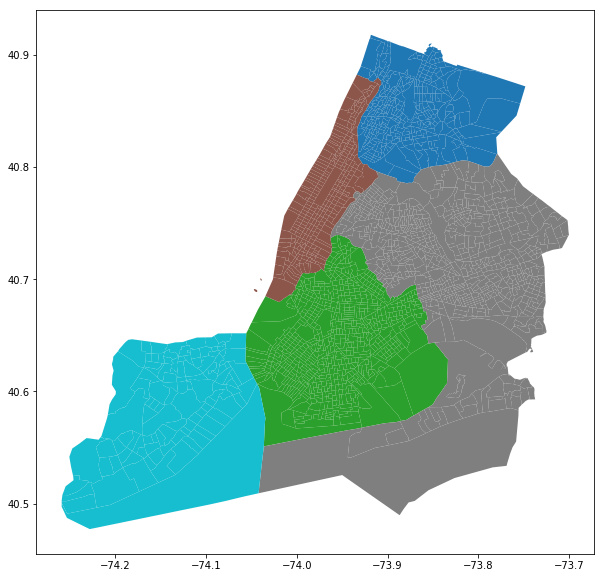

In [23]:
f, ax = plt.subplots(figsize=(10,10))
# vmin, vmax = min(PUMA_shp['inc_change']) , max(PUMA_shp['inc_change'])

ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
gdf.plot(column = 'COUNTYFP', alpha =1, linewidth = 0.5, ax = ax)
# plt.title('Change of Income growth from 1990 to 2010 in PUMA district')

# fig = ax.get_figure()
# cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
# sm = plt.cm.ScalarMappable(cmap='coolwarm', norm=plt.Normalize(vmin=vmin, vmax=vmax))
# sm._A = []
# fig.colorbar(sm, cax=cax)

# plt.title('Change of Income growth(%)')

In [24]:
import pysal as ps

In [25]:
gdf.crs

{'init': u'epsg:4269'}

In [26]:
gdf.to_file('JointNY.shp', driver='ESRI Shapefile')

In [27]:
rW_CT = ps.weights.Rook.from_shapefile('/home/sunglyoung/CIVIC/NYC_yl5240/JointNY.shp')

/usr/local/lib/python2.7/dist-packages/pysal/weights/weights.py:186: UserWarning: There is one disconnected observation (no neighbors)
  warnings.warn("There is one disconnected observation (no neighbors)")
/usr/local/lib/python2.7/dist-packages/pysal/weights/weights.py:187: UserWarning: Island id: 1239
  warnings.warn("Island id: %s" % str(self.islands[0]))


In [28]:
WRmatrix, ids = rW_CT.full()

In [29]:
WRmatrix

array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       ..., 
       [ 0.,  0.,  0., ...,  0.,  1.,  0.],
       [ 0.,  0.,  0., ...,  1.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]])

In [30]:
rW_CT.transform = 'r'

('WARNING: ', 1239, ' is an island (no neighbors)')


In [31]:
gdf.shape

(2167, 19)

In [32]:
gdf.iloc[1239,:]

index                                                      1016
OBJECTID                                                   1017
STATEFP                                                      36
COUNTYFP                                                    061
TRACTCE                                                  000100
GEOID                                               36061000100
NAME                                                          1
NAMELSAD                                         Census Tract 1
MTFCC                                                     G5020
FUNCSTAT                                                      S
ALAND                                                     78638
AWATER                                                        0
INTPTLAT                                            +40.6900555
INTPTLON                                           -074.0461424
Shape_Leng                                            0.0175767
Shape_Area                              

In [33]:
gdf.drop(index = 1239)

,index,OBJECTID,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,Shape_Leng,Shape_Area,GEOID_Data,commute,geometry
0,1066,1067,36,005,005200,36005005200,52,Census Tract 52,G5020,S,182689.0,0.0,+40.8256291,-073.8824329,0.017642,0.000020,14000US36005005200,43.1846,POLYGON ((-73.88453100040533 40.82564699960938...
1,1067,1068,36,005,020200,36005020200,202,Census Tract 202,G5020,S,124809.0,0.0,+40.8384912,-073.8475792,0.015259,0.000013,14000US36005020200,45.7159,"POLYGON ((-73.8500409998922 40.8390940000881, ..."
2,1068,1069,36,005,015700,36005015700,157,Census Tract 157,G5020,S,319009.0,0.0,+40.8329991,-073.8854500,0.027540,0.000034,14000US36005015700,42.8248,POLYGON ((-73.89071399955139 40.83240900027522...
3,1069,1070,36,005,006500,36005006500,65,Census Tract 65,G5020,S,261808.0,0.0,+40.8173984,-073.9216592,0.031705,0.000028,14000US36005006500,35.9388,POLYGON ((-73.92644399969078 40.81645800033652...
4,1436,1437,36,005,022703,36005022703,227.03,Census Tract 227.03,G5020,S,38660.0,0.0,+40.8440365,-073.9105204,0.008120,0.000004,14000US36005022703,33.3761,POLYGON ((-73.91192700023083 40.84326700007205...
5,1437,1438,36,005,023302,36005023302,233.02,Census Tract 233.02,G5020,S,62577.0,0.0,+40.8481852,-073.9047291,0.012272,0.000007,14000US36005023302,44.1228,POLYGON ((-73.90748699962529 40.84780399975483...
6,1438,1439,36,005,023200,36005023200,232,Census Tract 232,G5020,S,142706.0,0.0,+40.8469746,-073.8633164,0.017844,0.000015,14000US36005023200,46.7984,POLYGON ((-73.86634299982956 40.84758999977873...
7,1439,1440,36,005,022901,36005022901,229.01,Census Tract 229.01,G5020,S,121893.0,0.0,+40.8460928,-073.9072191,0.016461,0.000013,14000US36005022901,36.3191,POLYGON ((-73.91104399998056 40.84520999974177...
8,1440,1441,36,005,023000,36005023000,230,Census Tract 230,G5020,S,159383.0,0.0,+40.8492873,-073.8660154,0.020884,0.000017,14000US36005023000,43.9971,POLYGON ((-73.86920899979549 40.84923900027968...
9,1441,1442,36,005,024600,36005024600,246,Census Tract 246,G5020,S,152436.0,0.0,+40.8516098,-073.8611557,0.022275,0.000016,14000US36005024600,38.8717,POLYGON ((-73.86304000039564 40.85061099969795...


In [34]:
gdf.shape

(2167, 19)

In [35]:
gdf.to_file('JointNY1.shp', driver='ESRI Shapefile')

In [36]:
rW_CT = ps.weights.Rook.from_shapefile('/home/sunglyoung/CIVIC/NYC_yl5240/JointNY1.shp')

In [37]:
WRmatrix, ids = rW_CT.full()
WRmatrix

array([[ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.],
       ..., 
       [ 0.,  0.,  0., ...,  0.,  1.,  0.],
       [ 0.,  0.,  0., ...,  1.,  0.,  0.],
       [ 0.,  0.,  0., ...,  0.,  0.,  0.]])

In [38]:
rW_CT.transform = 'r'

('WARNING: ', 1239, ' is an island (no neighbors)')


In [39]:
df = pd.read_csv('/home/sunglyoung/CIVIC/NYC_yl5240/data/geolytics_nyc_census_1990_2010.csv')

In [40]:
df.head()

,AREAKEY,INTPTLAT,INTPTLON,ZCTA5,TRCTPOP9,FAVINC9,MDFAMY9,FALTY59,FALTY109,FALT139,...,THY01251A,THY01501A,THY02001A,THY0M201A,MDHHY1A,MDVALHS1A,MDGRENT1A,RNTOCC9,RNTOCC0,RNTOCC1
0,36005000100,40.793492,-73.883532,11370.0,14303,0.00000,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,36005000200,40.804573,-73.856859,10473.0,2907,45267.28710,38711,31,29,29,...,203,48,68,11,59826,392500,1273,384,421,635
2,36005000400,40.808915,-73.850488,10473.0,2260,43694.20068,40484,15,19,24,...,97,161,96,73,71968,393700,1330,214,486,615
3,36005001600,40.818848,-73.858076,10473.0,5254,30042.84776,24732,61,142,53,...,20,38,20,0,30355,378100,823,1462,1517,1617
4,36005001900,40.800999,-73.909373,10454.0,1575,23377.47813,24823,76,50,0,...,19,21,0,0,25093,0,870,357,336,505


In [41]:
df.shape

(2168, 111)

In [42]:
cols = df.columns.str.replace('TRCTPOP', 'pop')\
            .str.replace('MDFAMY','median_fam_inc_')\
            .str.replace('FAVINC', 'ave_fam_inc_')\
            .str.replace('MDHHY', 'median_hh_inc_')\
            .str.replace('AVHHIN', 'ave_hh_inc_')\
            .str.replace('FALTY', 'fam_inc_')\
            .str.replace('FALT', 'fam_inc_')\
            .str.replace('MXB', 'max_')\
            .str.replace('FAY0', 'fam_inc_')\
            .str.replace('fam_inc_M', 'fam_inc_max_')\
            .str.replace('THY0', 'hh_inc_' )\
            .str.replace('hh_inc_M', 'hh_inc_max_')\
            .str.replace('MDVALHS','median_house_value_')\
            .str.replace('MDGRENT', 'median_rent_' )\
            .str.replace('1A', '1')\
            .str.replace('9A', '9')\
            .str.replace('RNTOCC', 'rent_units_')

df.columns = cols

df.rename(columns = {'AREAKEY' : 'census_tract','INTPTLAT':'lat', 'INTPTLON':'lon'}, 
          inplace = True)

In [43]:
df1 = pd.concat([df.iloc[:,:5], 
                 df.loc[:,df.columns[(df.columns.str.startswith('ava_'))|\
                                     (df.columns.str.startswith('median_'))|\
                                     (df.columns.str.startswith('rent_'))]]], 
                axis = 1)
df1.head()

,census_tract,lat,lon,ZCTA5,pop9,median_fam_inc_9,median_hh_inc_9,median_house_value_9,median_rent_9,median_fam_inc_0,median_hh_inc_0,median_house_value_0,median_rent_0,median_fam_inc_1,median_hh_inc_1,median_house_value_1,median_rent_1,rent_units_9,rent_units_0,rent_units_1
0,36005000100,40.793492,-73.883532,11370.0,14303,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,36005000200,40.804573,-73.856859,10473.0,2907,38711,31632,136500,742,50817,42539,147500,730,58368,59826,392500,1273,384,421,635
2,36005000400,40.808915,-73.850488,10473.0,2260,40484,36506,163234,535,41019,39111,157610,643,73148,71968,393700,1330,214,486,615
3,36005001600,40.818848,-73.858076,10473.0,5254,24732,22739,156800,466,30104,24552,177000,558,33555,30355,378100,823,1462,1517,1617
4,36005001900,40.800999,-73.909373,10454.0,1575,24823,11215,48868,422,23671,22772,145960,461,25489,25093,0,870,357,336,505


In [44]:
df1.columns

Index([u'census_tract', u'lat', u'lon', u'ZCTA5', u'pop9', u'median_fam_inc_9',
       u'median_hh_inc_9', u'median_house_value_9', u'median_rent_9',
       u'median_fam_inc_0', u'median_hh_inc_0', u'median_house_value_0',
       u'median_rent_0', u'median_fam_inc_1', u'median_hh_inc_1',
       u'median_house_value_1', u'median_rent_1', u'rent_units_9',
       u'rent_units_0', u'rent_units_1'],
      dtype='object')

In [45]:
df1.dropna()

,census_tract,lat,lon,ZCTA5,pop9,median_fam_inc_9,median_hh_inc_9,median_house_value_9,median_rent_9,median_fam_inc_0,median_hh_inc_0,median_house_value_0,median_rent_0,median_fam_inc_1,median_hh_inc_1,median_house_value_1,median_rent_1,rent_units_9,rent_units_0,rent_units_1
0,36005000100,40.793492,-73.883532,11370.0,14303,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,36005000200,40.804573,-73.856859,10473.0,2907,38711,31632,136500,742,50817,42539,147500,730,58368,59826,392500,1273,384,421,635
2,36005000400,40.808915,-73.850488,10473.0,2260,40484,36506,163234,535,41019,39111,157610,643,73148,71968,393700,1330,214,486,615
3,36005001600,40.818848,-73.858076,10473.0,5254,24732,22739,156800,466,30104,24552,177000,558,33555,30355,378100,823,1462,1517,1617
4,36005001900,40.800999,-73.909373,10454.0,1575,24823,11215,48868,422,23671,22772,145960,461,25489,25093,0,870,357,336,505
5,36005002000,40.817580,-73.866096,10473.0,9110,18762,14765,185400,298,19694,14691,177600,266,30817,24939,398100,455,2570,2601,2618
6,36005002300,40.809084,-73.925846,10454.0,4577,15189,7925,0,186,20217,14112,0,229,20342,13756,0,359,1758,1646,1763
7,36005002400,40.815753,-73.871112,10473.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
8,36005002500,40.807003,-73.920878,10454.0,5572,9807,8246,87500,276,15662,12221,99100,340,17048,15207,381300,570,1674,1675,1780
9,36005002701,40.805051,-73.916329,10454.0,3004,10109,8128,0,192,13077,12898,0,264,25269,19450,0,539,904,986,1039


In [46]:
df1.replace(0, np.NaN, inplace = True)

In [47]:
df1.shape

(2168, 20)

In [48]:
df1.head()

,census_tract,lat,lon,ZCTA5,pop9,median_fam_inc_9,median_hh_inc_9,median_house_value_9,median_rent_9,median_fam_inc_0,median_hh_inc_0,median_house_value_0,median_rent_0,median_fam_inc_1,median_hh_inc_1,median_house_value_1,median_rent_1,rent_units_9,rent_units_0,rent_units_1
0,36005000100,40.793492,-73.883532,11370.0,14303.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,36005000200,40.804573,-73.856859,10473.0,2907.0,38711.0,31632.0,136500.0,742.0,50817.0,42539.0,147500.0,730.0,58368.0,59826.0,392500.0,1273.0,384.0,421.0,635.0
2,36005000400,40.808915,-73.850488,10473.0,2260.0,40484.0,36506.0,163234.0,535.0,41019.0,39111.0,157610.0,643.0,73148.0,71968.0,393700.0,1330.0,214.0,486.0,615.0
3,36005001600,40.818848,-73.858076,10473.0,5254.0,24732.0,22739.0,156800.0,466.0,30104.0,24552.0,177000.0,558.0,33555.0,30355.0,378100.0,823.0,1462.0,1517.0,1617.0
4,36005001900,40.800999,-73.909373,10454.0,1575.0,24823.0,11215.0,48868.0,422.0,23671.0,22772.0,145960.0,461.0,25489.0,25093.0,NaN,870.0,357.0,336.0,505.0


In [49]:
df_inc_9 = df.loc[:,df.columns[(df.columns == 'census_tract') |\
                (df.columns.str.startswith('fam_inc_') & df.columns.str.endswith('9'))]]

df_inc_0 = df.loc[:,df.columns[(df.columns == 'census_tract') |\
                (df.columns.str.startswith('fam_inc_') & df.columns.str.endswith('0'))]]

df_inc_1 = df.loc[:,df.columns[(df.columns == 'census_tract') |\
               (df.columns.str.startswith('fam_inc_') & df.columns.str.endswith('1'))]]

 
df_inc_9.shape, df_inc_0.shape, df_inc_1.shape

((2168, 20), (2168, 17), (2168, 17))

In [50]:
df1.shape

(2168, 20)

In [51]:
df_inc_rent = df1.loc[:,df1.columns[(df1.columns == 'census_tract') |\
                                (df1.columns.str.startswith('median_fam_inc')) |\
                                (df1.columns.str.startswith('median_rent'))|\
                                 (df1.columns.str.startswith('rent'))]]

In [52]:
df_inc_rent.head()

,census_tract,median_fam_inc_9,median_rent_9,median_fam_inc_0,median_rent_0,median_fam_inc_1,median_rent_1,rent_units_9,rent_units_0,rent_units_1
0,36005000100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,36005000200,38711.0,742.0,50817.0,730.0,58368.0,1273.0,384.0,421.0,635.0
2,36005000400,40484.0,535.0,41019.0,643.0,73148.0,1330.0,214.0,486.0,615.0
3,36005001600,24732.0,466.0,30104.0,558.0,33555.0,823.0,1462.0,1517.0,1617.0
4,36005001900,24823.0,422.0,23671.0,461.0,25489.0,870.0,357.0,336.0,505.0


In [53]:
df_inc_rent.shape

(2168, 10)

In [54]:
df_inc_rent.columns = ['tract', 'inc_9', 'rent_9','inc_0', 'rent_0', 'inc_1',  'rent_1',
                      'r_units_9','r_units_0','r_units_1']

df_inc_rent.head()

,tract,inc_9,rent_9,inc_0,rent_0,inc_1,rent_1,r_units_9,r_units_0,r_units_1
0,36005000100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,36005000200,38711.0,742.0,50817.0,730.0,58368.0,1273.0,384.0,421.0,635.0
2,36005000400,40484.0,535.0,41019.0,643.0,73148.0,1330.0,214.0,486.0,615.0
3,36005001600,24732.0,466.0,30104.0,558.0,33555.0,823.0,1462.0,1517.0,1617.0
4,36005001900,24823.0,422.0,23671.0,461.0,25489.0,870.0,357.0,336.0,505.0


In [55]:
df_inc_rent['ratio_rent_inc_9'] = df_inc_rent.rent_9*12/df_inc_rent.inc_9
df_inc_rent['ratio_rent_inc_0'] = df_inc_rent.rent_0*12/df_inc_rent.inc_0
df_inc_rent['ratio_rent_inc_1'] = df_inc_rent.rent_1*12/df_inc_rent.inc_1
df_inc_rent.head()

,tract,inc_9,rent_9,inc_0,rent_0,inc_1,rent_1,r_units_9,r_units_0,r_units_1,ratio_rent_inc_9,ratio_rent_inc_0,ratio_rent_inc_1
0,36005000100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,36005000200,38711.0,742.0,50817.0,730.0,58368.0,1273.0,384.0,421.0,635.0,0.230012,0.172383,0.261719
2,36005000400,40484.0,535.0,41019.0,643.0,73148.0,1330.0,214.0,486.0,615.0,0.158581,0.188108,0.218188
3,36005001600,24732.0,466.0,30104.0,558.0,33555.0,823.0,1462.0,1517.0,1617.0,0.226104,0.222429,0.294323
4,36005001900,24823.0,422.0,23671.0,461.0,25489.0,870.0,357.0,336.0,505.0,0.204004,0.233704,0.409588


In [56]:
df_inc_rent.shape

(2168, 13)

In [57]:
def inc_div(x):
    x1 = x * 0.5
    x2 = x * 0.8
    x3 = x
    x4 = x * 1.2
    x5 = x * 1.5
    return([int(x1), int(x2), int(x3), int(x4), int(x5)])

In [58]:
df_inc_rent

,tract,inc_9,rent_9,inc_0,rent_0,inc_1,rent_1,r_units_9,r_units_0,r_units_1,ratio_rent_inc_9,ratio_rent_inc_0,ratio_rent_inc_1
0,36005000100,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,36005000200,38711.0,742.0,50817.0,730.0,58368.0,1273.0,384.0,421.0,635.0,0.230012,0.172383,0.261719
2,36005000400,40484.0,535.0,41019.0,643.0,73148.0,1330.0,214.0,486.0,615.0,0.158581,0.188108,0.218188
3,36005001600,24732.0,466.0,30104.0,558.0,33555.0,823.0,1462.0,1517.0,1617.0,0.226104,0.222429,0.294323
4,36005001900,24823.0,422.0,23671.0,461.0,25489.0,870.0,357.0,336.0,505.0,0.204004,0.233704,0.409588
5,36005002000,18762.0,298.0,19694.0,266.0,30817.0,455.0,2570.0,2601.0,2618.0,0.190598,0.162080,0.177175
6,36005002300,15189.0,186.0,20217.0,229.0,20342.0,359.0,1758.0,1646.0,1763.0,0.146948,0.135925,0.211779
7,36005002400,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN
8,36005002500,9807.0,276.0,15662.0,340.0,17048.0,570.0,1674.0,1675.0,1780.0,0.337718,0.260503,0.401220
9,36005002701,10109.0,192.0,13077.0,264.0,25269.0,539.0,904.0,986.0,1039.0,0.227916,0.242257,0.255966


In [59]:
df_inc_rent1 = df_inc_rent.dropna()

In [60]:
df_inc_rent1.head()

,tract,inc_9,rent_9,inc_0,rent_0,inc_1,rent_1,r_units_9,r_units_0,r_units_1,ratio_rent_inc_9,ratio_rent_inc_0,ratio_rent_inc_1
1,36005000200,38711.0,742.0,50817.0,730.0,58368.0,1273.0,384.0,421.0,635.0,0.230012,0.172383,0.261719
2,36005000400,40484.0,535.0,41019.0,643.0,73148.0,1330.0,214.0,486.0,615.0,0.158581,0.188108,0.218188
3,36005001600,24732.0,466.0,30104.0,558.0,33555.0,823.0,1462.0,1517.0,1617.0,0.226104,0.222429,0.294323
4,36005001900,24823.0,422.0,23671.0,461.0,25489.0,870.0,357.0,336.0,505.0,0.204004,0.233704,0.409588
5,36005002000,18762.0,298.0,19694.0,266.0,30817.0,455.0,2570.0,2601.0,2618.0,0.190598,0.162080,0.177175


In [61]:
df_inc_rent1.shape

(2089, 13)

In [62]:
median_inc_9, median_inc_0, median_inc_1 = df_inc_rent1[['inc_9', 'inc_0', 'inc_1']].median()
median_inc_9, median_inc_0, median_inc_1

(36218.0, 42590.0, 56726.0)

In [63]:
inc_div_9 = inc_div(median_inc_9)

inc_div_0 = inc_div(median_inc_0)

inc_div_1 = inc_div(median_inc_1)

In [64]:
inc_div_9, inc_div_0, inc_div_1

([18109, 28974, 36218, 43461, 54327],
 [21295, 34072, 42590, 51108, 63885],
 [28363, 45380, 56726, 68071, 85089])

In [65]:
df_inc_9.columns

Index([u'census_tract', u'fam_inc_59', u'fam_inc_109', u'fam_inc_139',
       u'fam_inc_159', u'fam_inc_189', u'fam_inc_209', u'fam_inc_239',
       u'fam_inc_259', u'fam_inc_289', u'fam_inc_309', u'fam_inc_359',
       u'fam_inc_409', u'fam_inc_499', u'fam_inc_609', u'fam_inc_759',
       u'fam_inc_1009', u'fam_inc_1259', u'fam_inc_1509', u'fam_inc_max_9'],
      dtype='object')

In [66]:
# ideal division boundary for 1990: [18109, 28974, 36218, 43461, 54327]
df_inc_9['inc_group1_9'] = df_inc_9['fam_inc_59'] + df_inc_9['fam_inc_109']\
                        + df_inc_9['fam_inc_139'] + df_inc_9['fam_inc_159'] \
                        + df_inc_9['fam_inc_189'] 
        
df_inc_9['inc_group2_9'] = df_inc_9['fam_inc_209'] + df_inc_9['fam_inc_239'] + \
                           df_inc_9['fam_inc_259'] + df_inc_9['fam_inc_289'] + \
                           df_inc_9['fam_inc_309']
        
df_inc_9['inc_group3_9'] =  df_inc_9['fam_inc_359']

df_inc_9['inc_group4_9'] = df_inc_9['fam_inc_409']

df_inc_9['inc_group5_9'] = df_inc_9['fam_inc_499']  

df_inc_9['inc_group6_9'] =  df_inc_9['fam_inc_609'] + df_inc_9['fam_inc_759'] \
                            + df_inc_9['fam_inc_1009'] + df_inc_9['fam_inc_1259']\
                            + df_inc_9['fam_inc_1509'] + df_inc_9['fam_inc_max_9']

In [67]:
df_inc_div_9 = df_inc_9[['census_tract', 'inc_group1_9', 'inc_group2_9', 
          'inc_group3_9', 'inc_group4_9',
         'inc_group5_9', 'inc_group6_9']]
df_inc_div_9.sum()[1:]

inc_group1_9    455108
inc_group2_9    316999
inc_group3_9    118471
inc_group4_9    107129
inc_group5_9    191431
inc_group6_9    566609
dtype: int64

In [68]:
# ideal division boundary for 2010: [21295, 34072, 42590, 51108, 63885]
df_inc_0['inc_group1_0'] = df_inc_0['fam_inc_100'] + df_inc_0['fam_inc_150']\
                        + df_inc_0['fam_inc_200'] 
    
df_inc_0['inc_group2_0'] = df_inc_0['fam_inc_250'] + df_inc_0['fam_inc_300'] \
                        + df_inc_0['fam_inc_350']
    
df_inc_0['inc_group3_0'] =  df_inc_0['fam_inc_400']

df_inc_0['inc_group4_0'] =  df_inc_0['fam_inc_450'] + df_inc_0['fam_inc_500']

df_inc_0['inc_group5_0'] = df_inc_0['fam_inc_600'] 

df_inc_0['inc_group6_0'] = df_inc_0['fam_inc_750'] + df_inc_0['fam_inc_1000'] \
                            + df_inc_0['fam_inc_1250'] + df_inc_0['fam_inc_1500']\
                            + df_inc_0['fam_inc_2000']  + df_inc_0['fam_inc_max_200']

In [69]:
df_inc_div_0 = df_inc_0[['census_tract', 'inc_group1_0', 'inc_group2_0', 
          'inc_group3_0', 'inc_group4_0',
         'inc_group5_0', 'inc_group6_0']]
df_inc_div_0.sum()[1:]

inc_group1_0    468708
inc_group2_0    328006
inc_group3_0     97823
inc_group4_0    171594
inc_group5_0    148111
inc_group6_0    655567
dtype: int64

In [70]:
# ideal division boundary for 2010: [28363, 45380, 56726, 68071, 85089]
df_inc_1['inc_group1_1'] = df_inc_1['fam_inc_101'] + df_inc_1['fam_inc_151']\
                        + df_inc_1['fam_inc_201']  + df_inc_1['fam_inc_251']\
                        + df_inc_1['fam_inc_301']
    
df_inc_1['inc_group2_1'] =  df_inc_1['fam_inc_351'] + df_inc_1['fam_inc_401']\
                        + df_inc_1['fam_inc_451']
    
df_inc_1['inc_group3_1'] =  df_inc_1['fam_inc_501'] + df_inc_1['fam_inc_601']

df_inc_1['inc_group4_1'] =  df_inc_1['fam_inc_751'] 

df_inc_1['inc_group5_1'] =  df_inc_1['fam_inc_1001']

df_inc_1['inc_group6_1'] =  df_inc_1['fam_inc_1251'] + df_inc_1['fam_inc_1501']\
                            + df_inc_1['fam_inc_2001'] + df_inc_1['fam_inc_max_201']
        

In [71]:
df_inc_div_1 = df_inc_1[['census_tract', 'inc_group1_1', 'inc_group2_1', 
          'inc_group3_1', 'inc_group4_1',
         'inc_group5_1', 'inc_group6_1']]
df_inc_div_1.sum()[1:]

inc_group1_1    511400
inc_group2_1    259026
inc_group3_1    208721
inc_group4_1    171782
inc_group5_1    216655
inc_group6_1    474705
dtype: int64

In [72]:
# define entropy index 
def entropy_index(x):
    Q_sum = 0
    for i in x:
        if i == 0:
            Q = 0
        else:
            Q = (-1) * (i/sum(x)) * np.log(i/sum(x))
        Q_sum += Q
    entropy_index = Q_sum/np.log(len(x))
    return entropy_index

In [73]:
df_inc_div_9.is_copy = False
df_inc_div_0.is_copy = False
df_inc_div_1.is_copy = False

In [74]:
df_inc_div_9.head()

,census_tract,inc_group1_9,inc_group2_9,inc_group3_9,inc_group4_9,inc_group5_9,inc_group6_9
0,36005000100,0,0,0,0,0,0
1,36005000200,133,177,32,31,84,257
2,36005000400,89,101,50,50,89,221
3,36005001600,353,381,165,39,161,195
4,36005001900,175,42,0,0,67,36


In [75]:
for i in df_inc_div_9.index:
    df_inc_div_9.loc[i,'entropy_index_9'] = \
    entropy_index(df_inc_div_9.loc[i,'inc_group1_9':'inc_group6_9'])
    
for i in df_inc_div_0.index:
    df_inc_div_0.loc[i,'entropy_index_0'] = \
            entropy_index((df_inc_div_0.loc[i,'inc_group1_0':'inc_group6_0']))
        
for i in df_inc_div_1.index:
    df_inc_div_1.loc[i,'entropy_index_1'] = \
            entropy_index((df_inc_div_1.loc[i,'inc_group1_1':'inc_group6_1']))

In [76]:
df_inc_div_9.head()

,census_tract,inc_group1_9,inc_group2_9,inc_group3_9,inc_group4_9,inc_group5_9,inc_group6_9,entropy_index_9
0,36005000100,0,0,0,0,0,0,0.000000
1,36005000200,133,177,32,31,84,257,0.867149
2,36005000400,89,101,50,50,89,221,0.919819
3,36005001600,353,381,165,39,161,195,0.908063
4,36005001900,175,42,0,0,67,36,0.652853


In [77]:
df_inc_div_0.head()

,census_tract,inc_group1_0,inc_group2_0,inc_group3_0,inc_group4_0,inc_group5_0,inc_group6_0,entropy_index_0
0,36005000100,0,0,0,0,0,0,0.000000
1,36005000200,203,94,60,69,72,369,0.857971
2,36005000400,150,191,65,70,84,267,0.923299
3,36005001600,414,303,97,185,92,242,0.925875
4,36005001900,87,90,9,16,30,21,0.830158


In [78]:
df_inc_div_1.head()

,census_tract,inc_group1_1,inc_group2_1,inc_group3_1,inc_group4_1,inc_group5_1,inc_group6_1,entropy_index_1
0,36005000100,0,0,0,0,0,0,0.000000
1,36005000200,210,240,101,49,136,319,0.921479
2,36005000400,169,157,227,79,206,386,0.943208
3,36005001600,598,301,143,167,129,69,0.862742
4,36005001900,233,61,22,16,12,30,0.672415


In [79]:
df_entropy = df_inc_div_9[['census_tract','entropy_index_9']].merge\
            (df_inc_div_0[['census_tract','entropy_index_0']],on = 'census_tract').merge\
            (df_inc_div_1[['census_tract','entropy_index_1']],on = 'census_tract')

In [80]:
df_entropy.rename(columns = {'census_tract':'tract'}, inplace = True)
df_entropy.shape

(2168, 4)

In [81]:
df_entropy.head()

,tract,entropy_index_9,entropy_index_0,entropy_index_1
0,36005000100,0.000000,0.000000,0.000000
1,36005000200,0.867149,0.857971,0.921479
2,36005000400,0.919819,0.923299,0.943208
3,36005001600,0.908063,0.925875,0.862742
4,36005001900,0.652853,0.830158,0.672415


In [82]:
df_census = df_entropy.merge(df_inc_rent, on = 'tract', how = 'left')

In [83]:
df_census.head()

,tract,entropy_index_9,entropy_index_0,entropy_index_1,inc_9,rent_9,inc_0,rent_0,inc_1,rent_1,r_units_9,r_units_0,r_units_1,ratio_rent_inc_9,ratio_rent_inc_0,ratio_rent_inc_1
0,36005000100,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,36005000200,0.867149,0.857971,0.921479,38711.0,742.0,50817.0,730.0,58368.0,1273.0,384.0,421.0,635.0,0.230012,0.172383,0.261719
2,36005000400,0.919819,0.923299,0.943208,40484.0,535.0,41019.0,643.0,73148.0,1330.0,214.0,486.0,615.0,0.158581,0.188108,0.218188
3,36005001600,0.908063,0.925875,0.862742,24732.0,466.0,30104.0,558.0,33555.0,823.0,1462.0,1517.0,1617.0,0.226104,0.222429,0.294323
4,36005001900,0.652853,0.830158,0.672415,24823.0,422.0,23671.0,461.0,25489.0,870.0,357.0,336.0,505.0,0.204004,0.233704,0.409588


In [84]:
df_census['norm_inc9'] =  (df_census.inc_9 - df_census.inc_9.min())\
                            / (df_census.inc_9.max() - df_census.inc_9.min())

In [85]:
df_census['norm_inc0'] =  (df_census.inc_0 - df_census.inc_0.min())\
                            / (df_census.inc_0.max() - df_census.inc_0.min())

In [86]:
df_census['norm_inc1'] =  (df_census.inc_1 - df_census.inc_1.min())\
                            / (df_census.inc_1.max() - df_census.inc_1.min())

In [87]:
df_census['norm_rent9'] =  (df_census.rent_9 - df_census.rent_9.min())\
                            / (df_census.rent_9.max() - df_census.rent_9.min())

In [88]:
df_census['norm_rent0'] =  (df_census.rent_0 - df_census.rent_0.min())\
                            / (df_census.rent_0.max() - df_census.rent_0.min())

In [89]:
df_census['norm_rent1'] =  (df_census.rent_1 - df_census.rent_1.min())\
                            / (df_census.rent_1.max() - df_census.rent_1.min())

In [90]:
df_census.head()

,tract,entropy_index_9,entropy_index_0,entropy_index_1,inc_9,rent_9,inc_0,rent_0,inc_1,rent_1,...,r_units_1,ratio_rent_inc_9,ratio_rent_inc_0,ratio_rent_inc_1,norm_inc9,norm_inc0,norm_inc1,norm_rent9,norm_rent0,norm_rent1
0,36005000100,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,36005000200,0.867149,0.857971,0.921479,38711.0,742.0,50817.0,730.0,58368.0,1273.0,...,635.0,0.230012,0.172383,0.261719,0.257646,0.235773,0.225732,0.738911,0.308864,0.588701
2,36005000400,0.919819,0.923299,0.943208,40484.0,535.0,41019.0,643.0,73148.0,1330.0,...,615.0,0.158581,0.188108,0.218188,0.269473,0.185581,0.285448,0.530242,0.261555,0.620904
3,36005001600,0.908063,0.925875,0.862742,24732.0,466.0,30104.0,558.0,33555.0,823.0,...,1617.0,0.226104,0.222429,0.294323,0.164400,0.129666,0.125478,0.460685,0.215334,0.334463
4,36005001900,0.652853,0.830158,0.672415,24823.0,422.0,23671.0,461.0,25489.0,870.0,...,505.0,0.204004,0.233704,0.409588,0.165007,0.096712,0.092888,0.416331,0.162588,0.361017


In [91]:
df_census.shape

(2168, 22)

In [92]:
df_census.columns

Index([u'tract', u'entropy_index_9', u'entropy_index_0', u'entropy_index_1',
       u'inc_9', u'rent_9', u'inc_0', u'rent_0', u'inc_1', u'rent_1',
       u'r_units_9', u'r_units_0', u'r_units_1', u'ratio_rent_inc_9',
       u'ratio_rent_inc_0', u'ratio_rent_inc_1', u'norm_inc9', u'norm_inc0',
       u'norm_inc1', u'norm_rent9', u'norm_rent0', u'norm_rent1'],
      dtype='object')

In [93]:
df_census['rent_9_0'] =  (df_census.rent_0 - df_census.rent_9) / (df_census.rent_9)

In [94]:
df_census['rent_0_1'] =  (df_census.rent_1 - df_census.rent_0) / (df_census.rent_0)

In [95]:
df_census['inc_9_0'] =  (df_census.inc_0 - df_census.inc_9) / (df_census.inc_9)

In [96]:
df_census['inc_0_1'] =  (df_census.inc_1 - df_census.inc_0) / (df_census.inc_0)

In [97]:
df_census['rent_9_0'] = ( df_census.rent_0 - df_census.rent_9 ) / (df_census.rent_9)

In [98]:
df_census['rent_0_1'] = ( df_census.rent_1 - df_census.rent_0 ) / (df_census.rent_0)

In [99]:
df_census['r_unit_9_0'] = (df_census.r_units_9 - df_census.r_units_0) / (df_census.r_units_9)

In [100]:
df_census['r_unit_0_1'] = (df_census.r_units_0 - df_census.r_units_1) / (df_census.r_units_0)

In [101]:
df_census.shape

(2168, 28)

In [102]:
gdf = gpd.read_file('/home/sunglyoung/CIVIC/NYC_yl5240/JointNY1.shp')

In [103]:
gdf.GEOID = gdf.GEOID.astype(int)

In [104]:
gdf = gdf.merge(df_census, left_on = 'GEOID', right_on = 'tract')

In [105]:
gdf.head()

,index,OBJECTID,STATEFP,COUNTYFP,TRACTCE,GEOID,NAME,NAMELSAD,MTFCC,FUNCSTAT,...,norm_inc1,norm_rent9,norm_rent0,norm_rent1,rent_9_0,rent_0_1,inc_9_0,inc_0_1,r_unit_9_0,r_unit_0_1
0,1066,1067,36,005,005200,36005005200,52,Census Tract 52,G5020,S,...,0.134035,0.340726,0.078847,0.310734,-0.115274,1.543974,0.217040,0.741506,0.032258,-0.033333
1,1067,1068,36,005,020200,36005020200,202,Census Tract 202,G5020,S,...,0.157199,0.454637,0.263187,0.476271,0.404348,0.662539,0.004799,0.123545,0.088768,-0.206759
2,1068,1069,36,005,015700,36005015700,157,Census Tract 157,G5020,S,...,0.108040,0.342742,0.225122,0.389266,0.650430,0.597222,1.613342,0.151777,-0.403454,-0.101790
3,1069,1070,36,005,006500,36005006500,65,Census Tract 65,G5020,S,...,0.080181,0.413306,0.190321,0.341243,0.221957,0.630859,0.627742,0.119383,-0.117527,-0.085106
4,1436,1437,36,005,022703,36005022703,227.03,Census Tract 227.03,G5020,S,...,0.142362,0.503024,0.266449,0.443503,0.283465,0.558282,0.126386,0.479881,0.233062,0.019435


In [106]:
gdf.shape

(2167, 47)

In [107]:
gdf.columns

Index([           u'index',         u'OBJECTID',          u'STATEFP',
               u'COUNTYFP',          u'TRACTCE',            u'GEOID',
                   u'NAME',         u'NAMELSAD',            u'MTFCC',
               u'FUNCSTAT',            u'ALAND',           u'AWATER',
               u'INTPTLAT',         u'INTPTLON',       u'Shape_Leng',
             u'Shape_Area',       u'GEOID_Data',          u'commute',
               u'geometry',            u'tract',  u'entropy_index_9',
        u'entropy_index_0',  u'entropy_index_1',            u'inc_9',
                 u'rent_9',            u'inc_0',           u'rent_0',
                  u'inc_1',           u'rent_1',        u'r_units_9',
              u'r_units_0',        u'r_units_1', u'ratio_rent_inc_9',
       u'ratio_rent_inc_0', u'ratio_rent_inc_1',        u'norm_inc9',
              u'norm_inc0',        u'norm_inc1',       u'norm_rent9',
             u'norm_rent0',       u'norm_rent1',         u'rent_9_0',
               u'ren

In [275]:
gdf.ratio_rent_inc_9 = (gdf.ratio_rent_inc_9 - gdf.ratio_rent_inc_9.mean()) / gdf.ratio_rent_inc_9.std()

In [276]:
gdf.ratio_rent_inc_0 = (gdf.ratio_rent_inc_0 - gdf.ratio_rent_inc_0.mean()) / gdf.ratio_rent_inc_0.std()

In [277]:
gdf.ratio_rent_inc_1 = (gdf.ratio_rent_inc_1 - gdf.ratio_rent_inc_1.mean()) / gdf.ratio_rent_inc_1.std()

In [278]:
gdf.entropy_index_9 = (gdf.entropy_index_9 - gdf.entropy_index_9.mean()) / gdf.entropy_index_9.std()

In [279]:
gdf.entropy_index_0 = (gdf.entropy_index_0 - gdf.entropy_index_0.mean()) / gdf.entropy_index_0.std()

In [280]:
gdf.entropy_index_1 = (gdf.entropy_index_1 - gdf.entropy_index_9.mean()) / gdf.entropy_index_1.std()

In [281]:
rentburden_9 = gdf.ratio_rent_inc_9

In [282]:
rentburden_9[np.isnan(rentburden_9)] = 0

/home/sunglyoung/.local/lib/python2.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [283]:
I_rentburden_9 = ps.Moran(rentburden_9, rW_CT,permutations=999)

In [284]:
I_rentburden_9.I, I_rentburden_9.p_sim

(-0.00038660492267092103, 0.31900000000000001)

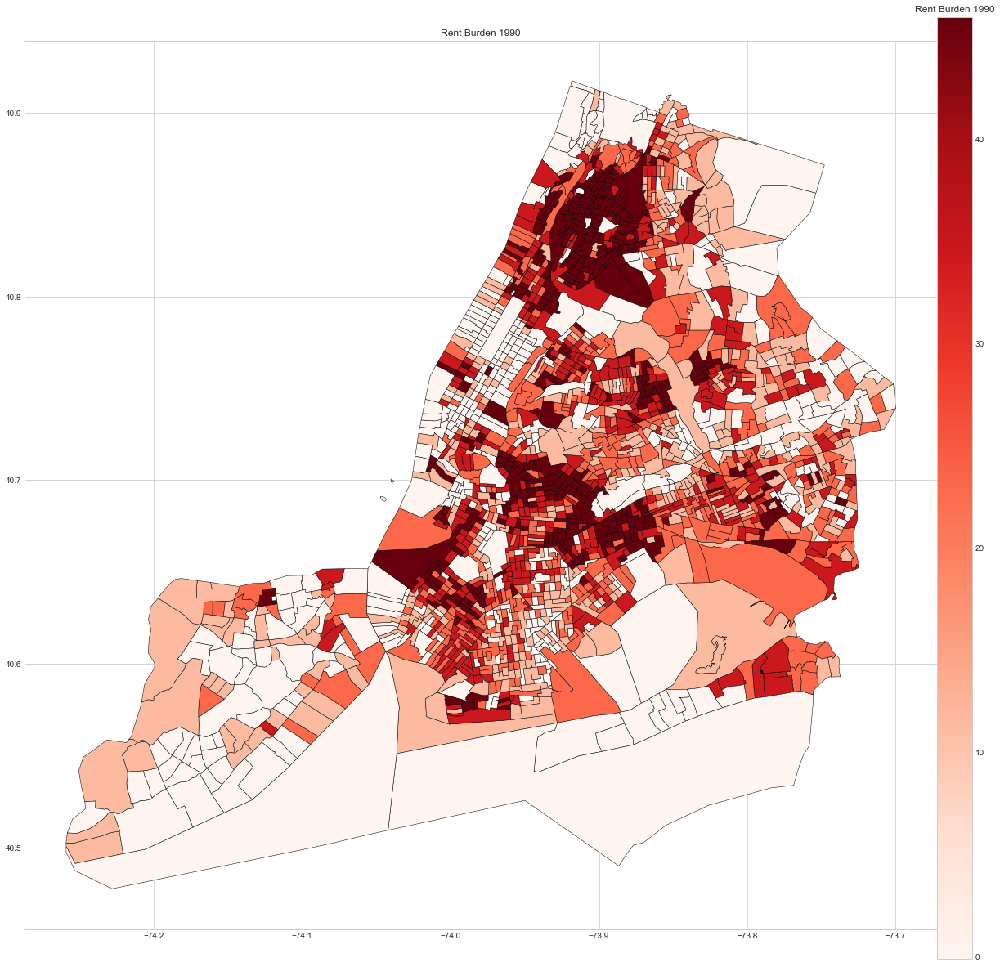

In [285]:
f, ax = plt.subplots(figsize=(20,20))
vmin, vmax = min(gdf['ratio_rent_inc_9']) , max(gdf['ratio_rent_inc_9'])

ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
gdf.plot(column = 'ratio_rent_inc_9', cmap ='Reds', alpha =1, scheme= 'quantiles', linewidth = 0.5, ax = ax, edgecolor='k')
plt.title('Rent Burden 1990')

fig = ax.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

plt.title('Rent Burden 1990')

In [286]:
Local_rentburden_9 = ps.Moran_Local(rentburden_9, rW_CT ,permutations=999)

In [287]:
gdf['significant'] = Local_rentburden_9.p_sim < 0.05
gdf['quadrant'] = Local_rentburden_9.q

In [288]:
import pylab 

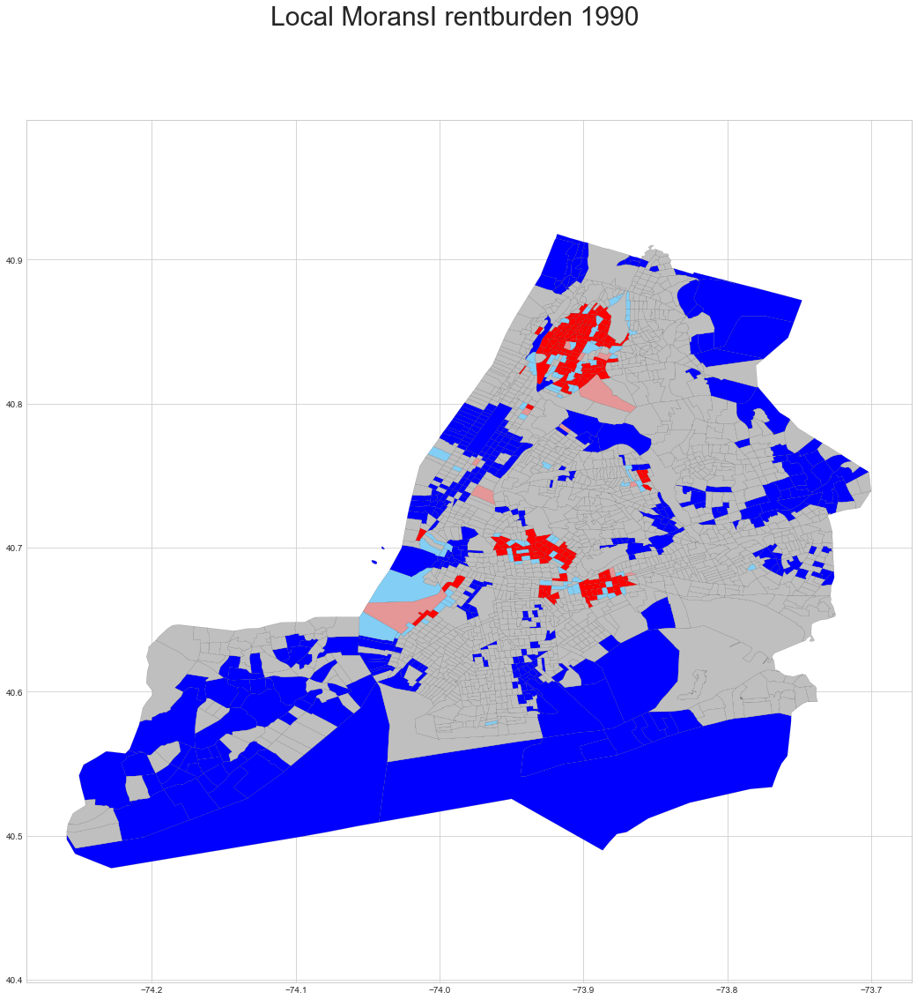

In [289]:
# Setup the figure and axis
f, ax = plt.subplots(1, figsize=(18, 18))
# Plot HH clusters
hh = gdf.loc[(gdf['quadrant']==1) & (gdf['significant']==True), 'geometry']

hh.plot(ax=ax, color='red', linewidth=0.1, edgecolor='k', label = 'HH')
# Plot LL clusters
ll = gdf.loc[(gdf['quadrant']==3) & (gdf['significant']==True), 'geometry']
ll.plot(ax=ax, color='blue', linewidth=0.1, edgecolor='k', label = 'LL')
# Plot LH clusters
lh = gdf.loc[(gdf['quadrant']==2) & (gdf['significant']==True), 'geometry']
lh.plot(ax=ax, color='#83cef4', linewidth=0.1, edgecolor='k', label = 'LH')
# Plot HL clusters
hl = gdf.loc[(gdf['quadrant']==4) & (gdf['significant']==True), 'geometry']
hl.plot(ax=ax, color='#e59696', linewidth=0.1, edgecolor='k', label ='HL')
# Non-significant
ns = gdf.loc[gdf['significant']!=True, 'geometry']
ns.plot(ax=ax, color='0.75', linewidth=0.1, edgecolor='k', label = 'insignificant')
# Style and draw
f.suptitle('Local MoransI rentburden 1990', size=30)
f.set_facecolor('1')


plt.axis('equal')
plt.show()

In [290]:
rentburden_0 = gdf.ratio_rent_inc_0
rentburden_0[np.isnan(rentburden_0)] = 0

/home/sunglyoung/.local/lib/python2.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [291]:
I_rentburden_0 = ps.Moran(rentburden_0, rW_CT,permutations=999)
I_rentburden_0.I, I_rentburden_0.p_sim

(0.38533211999255229, 0.001)

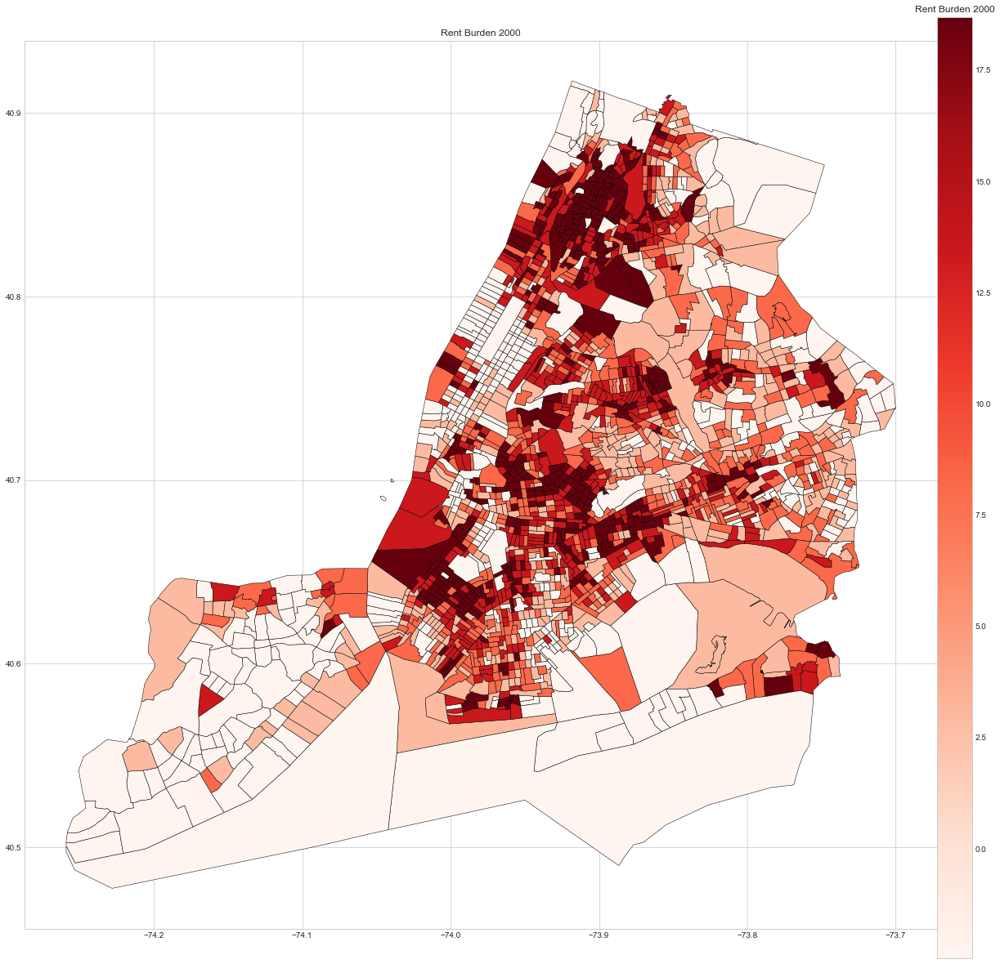

In [292]:
f, ax = plt.subplots(figsize=(20,20))
vmin, vmax = min(gdf['ratio_rent_inc_0']) , max(gdf['ratio_rent_inc_0'])

ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
gdf.plot(column = 'ratio_rent_inc_0', cmap ='Reds', alpha =1, scheme= 'quantiles', linewidth = 0.5, ax = ax, edgecolor='k')
plt.title('Rent Burden 2000')

fig = ax.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

plt.title('Rent Burden 2000')

In [293]:
Local_rentburden_0 = ps.Moran_Local(rentburden_0, rW_CT ,permutations=999)

In [294]:
gdf['r0_significant'] = Local_rentburden_0.p_sim < 0.05
gdf['r0_quadrant'] = Local_rentburden_0.q

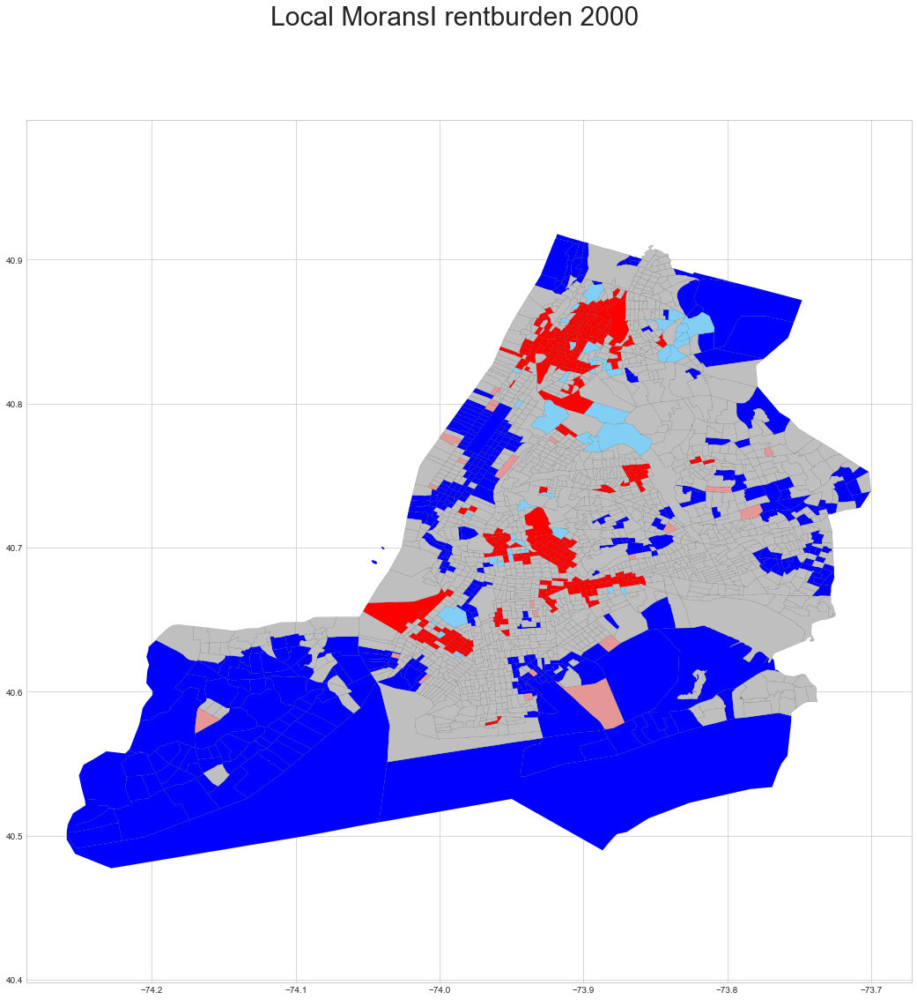

In [295]:
# Setup the figure and axis
f, ax = plt.subplots(1, figsize=(18, 18))
# Plot HH clusters
hh = gdf.loc[(gdf['r0_quadrant']==1) & (gdf['r0_significant']==True), 'geometry']

hh.plot(ax=ax, color='red', linewidth=0.1, edgecolor='k', label = 'HH')
# Plot LL clusters
ll = gdf.loc[(gdf['r0_quadrant']==3) & (gdf['r0_significant']==True), 'geometry']
ll.plot(ax=ax, color='blue', linewidth=0.1, edgecolor='k', label = 'LL')
# Plot LH clusters
lh = gdf.loc[(gdf['r0_quadrant']==2) & (gdf['r0_significant']==True), 'geometry']
lh.plot(ax=ax, color='#83cef4', linewidth=0.1, edgecolor='k', label = 'LH')
# Plot HL clusters
hl = gdf.loc[(gdf['r0_quadrant']==4) & (gdf['r0_significant']==True), 'geometry']
hl.plot(ax=ax, color='#e59696', linewidth=0.1, edgecolor='k', label ='HL')
# Non-significant
ns = gdf.loc[gdf['r0_significant']!=True, 'geometry']
ns.plot(ax=ax, color='0.75', linewidth=0.1, edgecolor='k', label = 'insignificant')
# Style and draw
f.suptitle('Local MoransI rentburden 2000', size=30)
f.set_facecolor('1')




plt.axis('equal')
plt.show()

## Rent Burden 2010

In [296]:
rentburden_1 = gdf.ratio_rent_inc_1
rentburden_1[np.isnan(rentburden_1)] = 0

/home/sunglyoung/.local/lib/python2.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [297]:
I_rentburden_1 = ps.Moran(rentburden_1, rW_CT,permutations=999)
I_rentburden_1.I, I_rentburden_1.p_sim

(0.40223819004233535, 0.001)

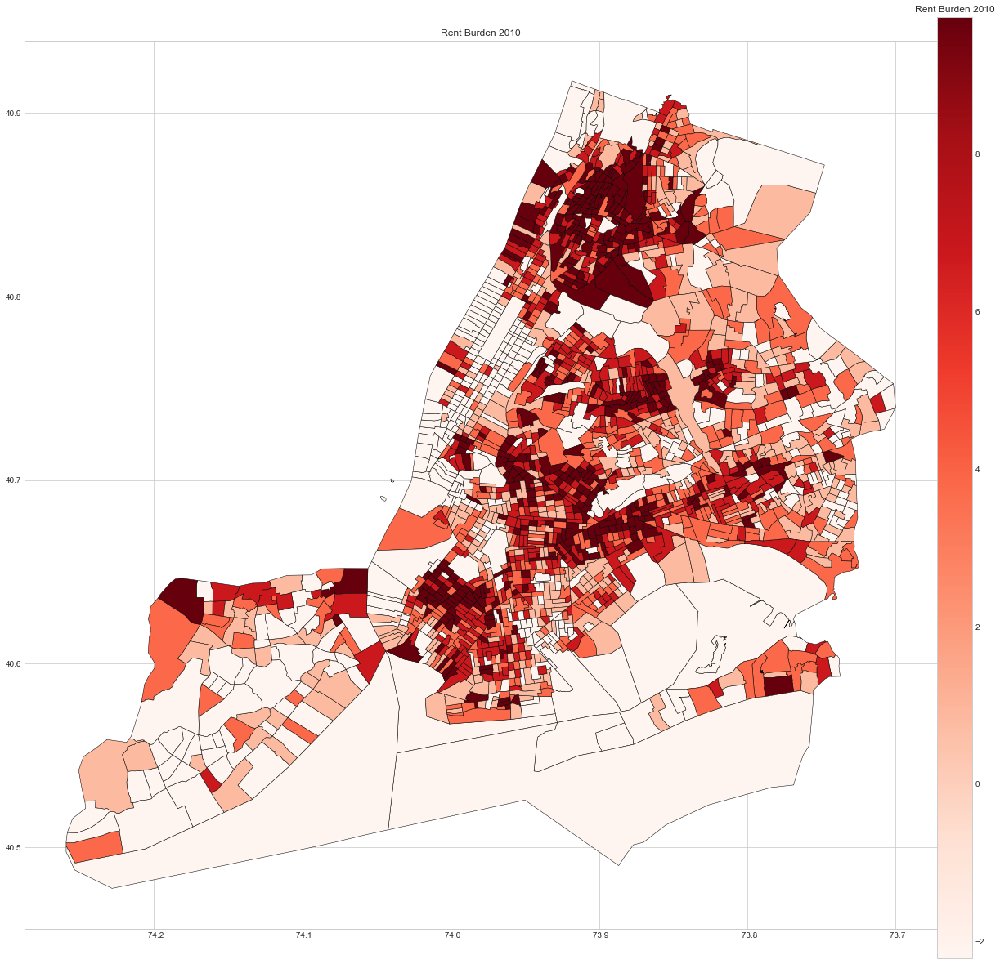

In [298]:
f, ax = plt.subplots(figsize=(20,20))
vmin, vmax = min(gdf['ratio_rent_inc_1']) , max(gdf['ratio_rent_inc_1'])

ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
gdf.plot(column = 'ratio_rent_inc_1', cmap ='Reds', alpha =1, scheme= 'quantiles', linewidth = 0.5, ax = ax, edgecolor='k')
plt.title('Rent Burden 2010')

fig = ax.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

plt.title('Rent Burden 2010')

In [299]:
Local_rentburden_1 = ps.Moran_Local(rentburden_1, rW_CT ,permutations=999)

In [300]:
gdf['r1_significant'] = Local_rentburden_1.p_sim < 0.05
gdf['r1_quadrant'] = Local_rentburden_1.q

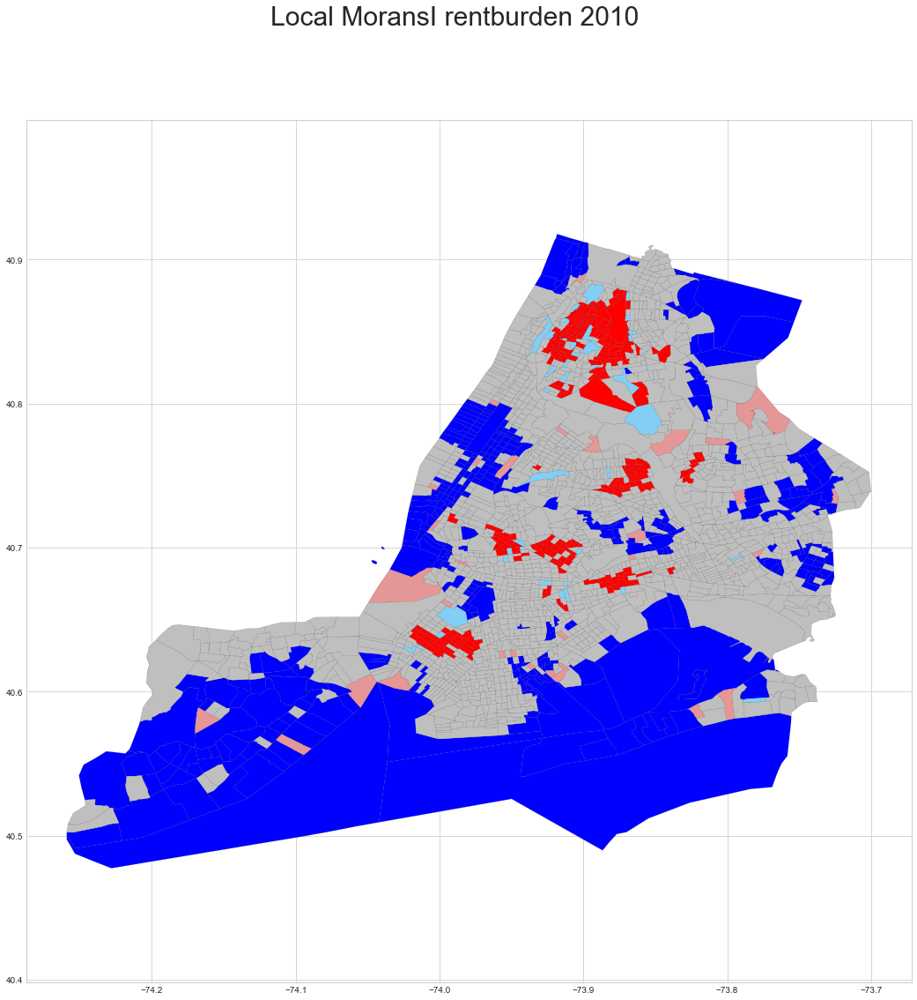

In [301]:
# Setup the figure and axis
f, ax = plt.subplots(1, figsize=(18, 18))
# Plot HH clusters
hh = gdf.loc[(gdf['r1_quadrant']==1) & (gdf['r1_significant']==True), 'geometry']

hh.plot(ax=ax, color='red', linewidth=0.1, edgecolor='k', label = 'HH')
# Plot LL clusters
ll = gdf.loc[(gdf['r1_quadrant']==3) & (gdf['r1_significant']==True), 'geometry']
ll.plot(ax=ax, color='blue', linewidth=0.1, edgecolor='k', label = 'LL')
# Plot LH clusters
lh = gdf.loc[(gdf['r1_quadrant']==2) & (gdf['r1_significant']==True), 'geometry']
lh.plot(ax=ax, color='#83cef4', linewidth=0.1, edgecolor='k', label = 'LH')
# Plot HL clusters
hl = gdf.loc[(gdf['r1_quadrant']==4) & (gdf['r1_significant']==True), 'geometry']
hl.plot(ax=ax, color='#e59696', linewidth=0.1, edgecolor='k', label ='HL')
# Non-significant
ns = gdf.loc[gdf['r1_significant']!=True, 'geometry']
ns.plot(ax=ax, color='0.75', linewidth=0.1, edgecolor='k', label = 'insignificant')
# Style and draw
f.suptitle('Local MoransI rentburden 2010', size=30)
f.set_facecolor('1')




plt.axis('equal')
plt.show()

#### Entropy

In [302]:
entropy_9 = gdf.entropy_index_9
entropy_9[np.isnan(entropy_9)] = 0

entropy_0 = gdf.entropy_index_0
entropy_0[np.isnan(entropy_0)] = 0

entropy_1 = gdf.entropy_index_1
entropy_1[np.isnan(entropy_1)] = 0

/home/sunglyoung/.local/lib/python2.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  
/home/sunglyoung/.local/lib/python2.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """
/home/sunglyoung/.local/lib/python2.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [303]:
I_entropy_9 = ps.Moran(entropy_9, rW_CT,permutations=999)
I_rentburden_1.I, I_rentburden_9.p_sim

(0.40223819004233535, 0.31900000000000001)

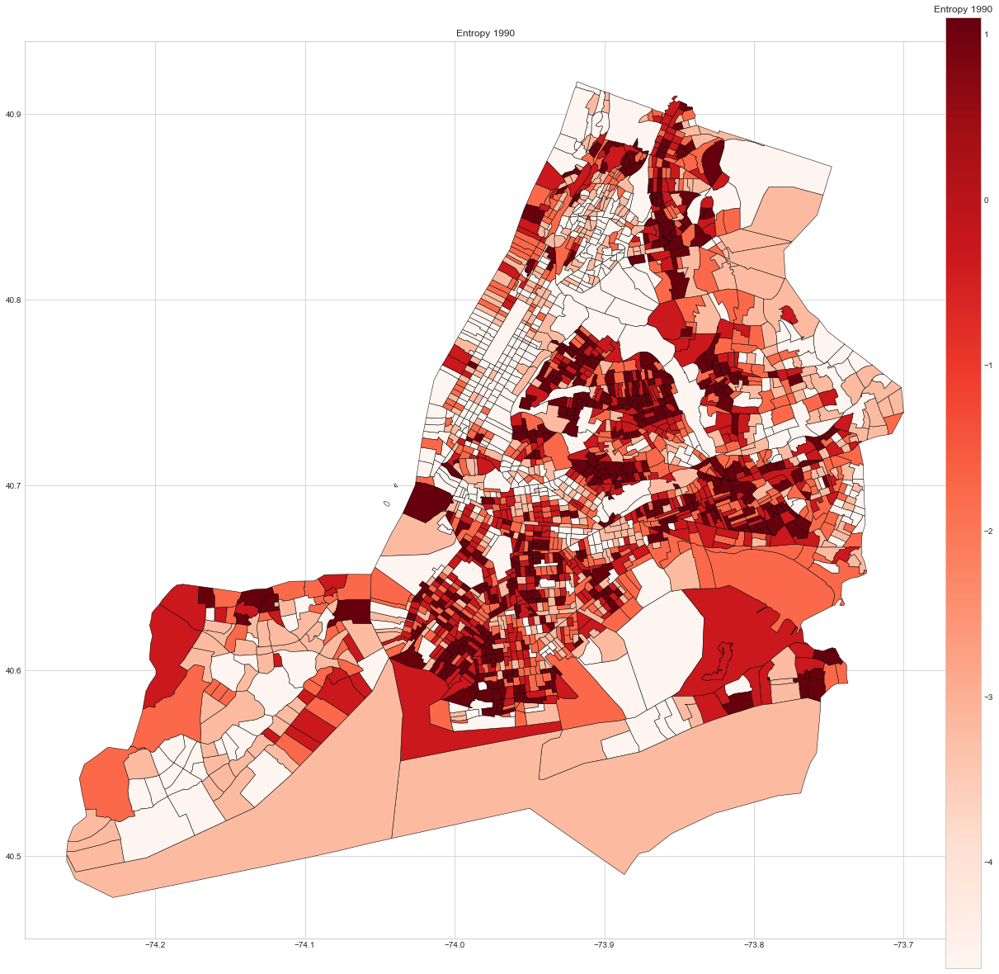

In [304]:
f, ax = plt.subplots(figsize=(20,20))
vmin, vmax = min(gdf['entropy_index_9']) , max(gdf['entropy_index_9'])

ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
gdf.plot(column = 'entropy_index_9', cmap ='Reds', alpha =1, scheme= 'quantiles', linewidth = 0.5, ax = ax, edgecolor='k')
plt.title('Entropy 1990')

fig = ax.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

plt.title('Entropy 1990')

In [305]:
Local_entropy_9 = ps.Moran_Local(entropy_9, rW_CT ,permutations=999)

In [306]:
gdf['e9_significant'] = Local_entropy_9.p_sim < 0.05
gdf['e9_quadrant'] = Local_entropy_9.q

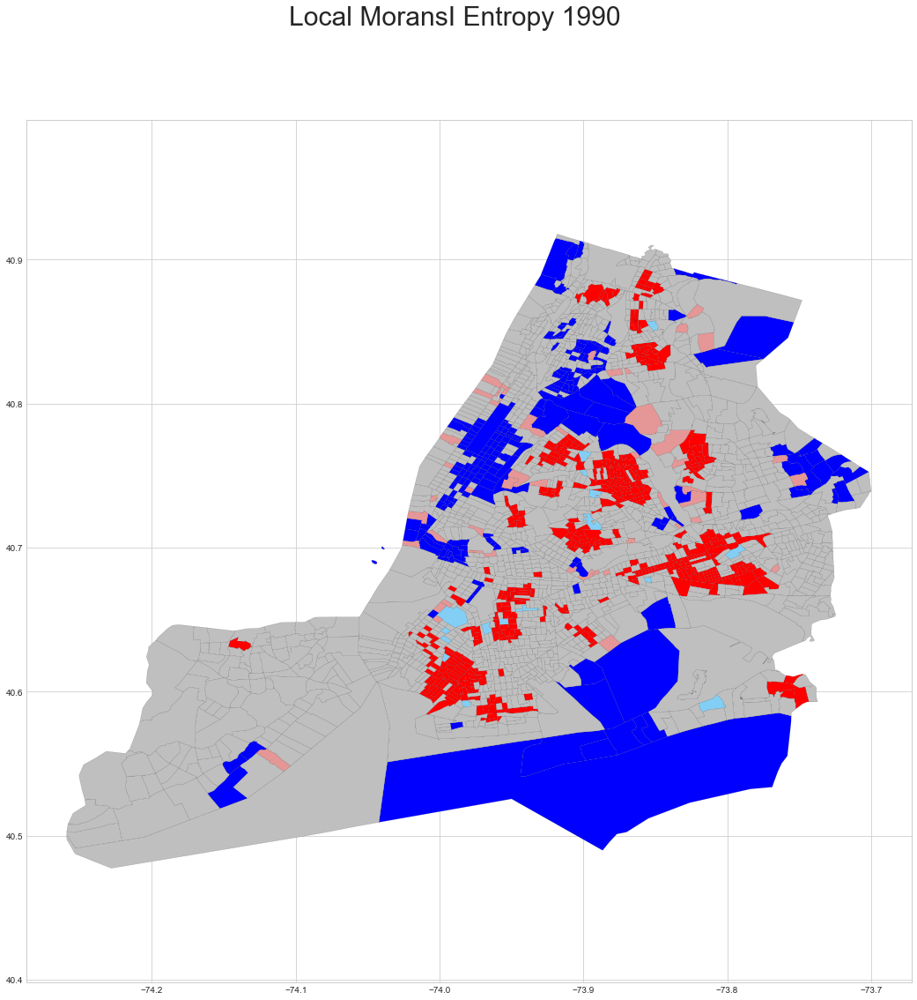

In [307]:
# Setup the figure and axis
f, ax = plt.subplots(1, figsize=(18, 18))
# Plot HH clusters
hh = gdf.loc[(gdf['e9_quadrant']==1) & (gdf['e9_significant']==True), 'geometry']

hh.plot(ax=ax, color='red', linewidth=0.1, edgecolor='k', label = 'HH')
# Plot LL clusters
ll = gdf.loc[(gdf['e9_quadrant']==3) & (gdf['e9_significant']==True), 'geometry']
ll.plot(ax=ax, color='blue', linewidth=0.1, edgecolor='k', label = 'LL')
# Plot LH clusters
lh = gdf.loc[(gdf['e9_quadrant']==2) & (gdf['e9_significant']==True), 'geometry']
lh.plot(ax=ax, color='#83cef4', linewidth=0.1, edgecolor='k', label = 'LH')
# Plot HL clusters
hl = gdf.loc[(gdf['e9_quadrant']==4) & (gdf['e9_significant']==True), 'geometry']
hl.plot(ax=ax, color='#e59696', linewidth=0.1, edgecolor='k', label ='HL')
# Non-significant
ns = gdf.loc[gdf['e9_significant']!=True, 'geometry']
ns.plot(ax=ax, color='0.75', linewidth=0.1, edgecolor='k', label = 'insignificant')
# Style and draw
f.suptitle('Local MoransI Entropy 1990', size=30)
f.set_facecolor('1')




plt.axis('equal')
plt.show()

In [308]:
I_entropy_0 = ps.Moran(entropy_0, rW_CT,permutations=999)
I_rentburden_0.I, I_rentburden_0.p_sim

(0.38533211999255229, 0.001)

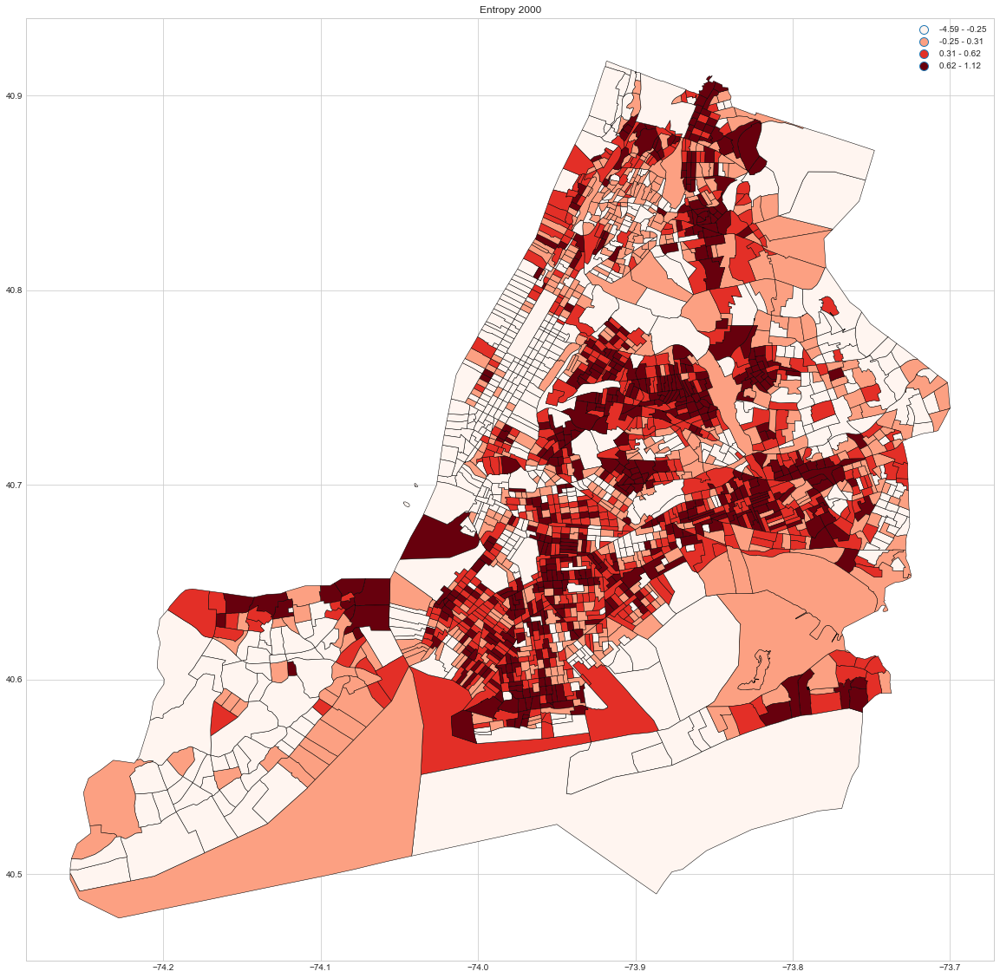

In [309]:
f, ax = plt.subplots(figsize=(20,20))
vmin, vmax = min(gdf['entropy_index_0']) , max(gdf['entropy_index_0'])

ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
gdf.plot(column = 'entropy_index_0', cmap ='Reds', alpha =1, scheme= 'quantiles', k=4, linewidth = 0.5, ax = ax, legend = True ,edgecolor='k')
plt.legend(fontsize =40)
plt.title('Entropy 2000')


# fig = ax.get_figure()
# cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
#sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))
#sm._A = []
# fig.colorbar(sm, cax=cax)

plt.title('Entropy 2000')

In [310]:
Local_entropy_0 = ps.Moran_Local(entropy_0, rW_CT ,permutations=999)

In [311]:
gdf['e0_significant'] = Local_entropy_0.p_sim < 0.05
gdf['e0_quadrant'] = Local_entropy_0.q

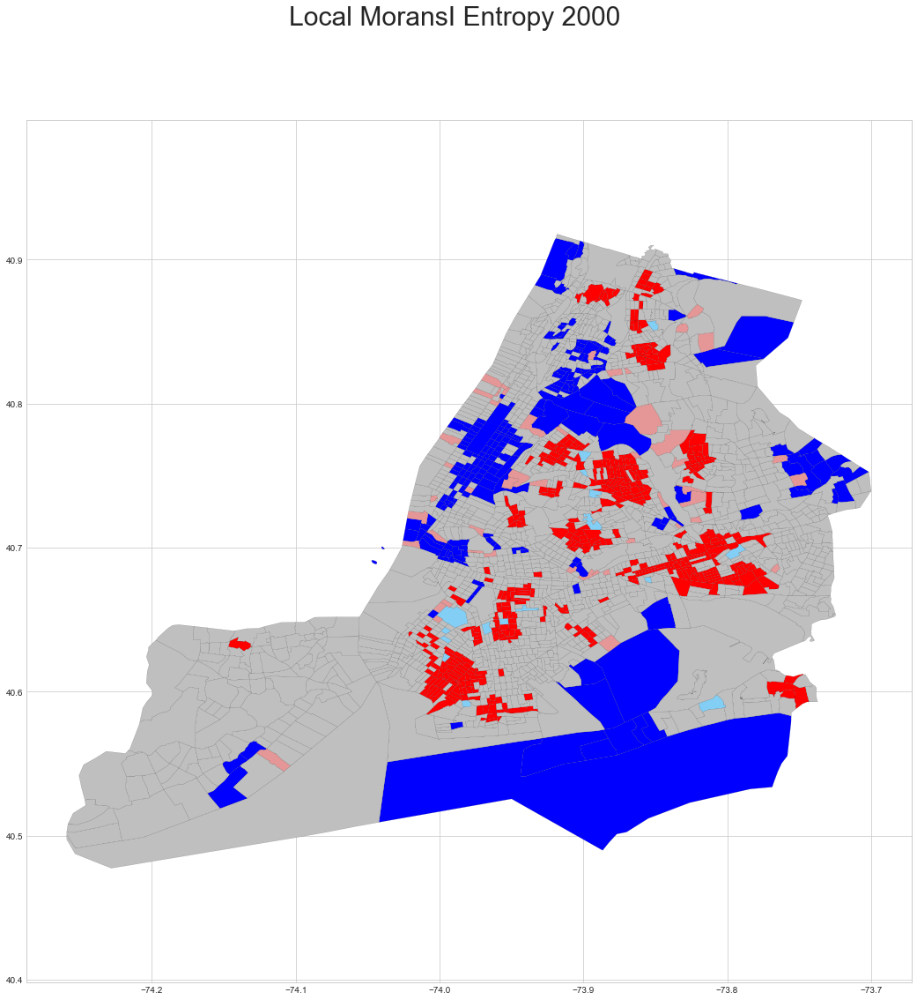

In [312]:
# Setup the figure and axis
f, ax = plt.subplots(1, figsize=(18, 18))
# Plot HH clusters
hh = gdf.loc[(gdf['e9_quadrant']==1) & (gdf['e9_significant']==True), 'geometry']

hh.plot(ax=ax, color='red', linewidth=0.1, edgecolor='k', label = 'HH')
# Plot LL clusters
ll = gdf.loc[(gdf['e9_quadrant']==3) & (gdf['e9_significant']==True), 'geometry']
ll.plot(ax=ax, color='blue', linewidth=0.1, edgecolor='k', label = 'LL')
# Plot LH clusters
lh = gdf.loc[(gdf['e9_quadrant']==2) & (gdf['e9_significant']==True), 'geometry']
lh.plot(ax=ax, color='#83cef4', linewidth=0.1, edgecolor='k', label = 'LH')
# Plot HL clusters
hl = gdf.loc[(gdf['e9_quadrant']==4) & (gdf['e9_significant']==True), 'geometry']
hl.plot(ax=ax, color='#e59696', linewidth=0.1, edgecolor='k', label ='HL')
# Non-significant
ns = gdf.loc[gdf['e9_significant']!=True, 'geometry']
ns.plot(ax=ax, color='0.75', linewidth=0.1, edgecolor='k', label = 'insignificant')
# Style and draw
f.suptitle('Local MoransI Entropy 2000', size=30)
f.set_facecolor('1')


plt.axis('equal')
plt.show()

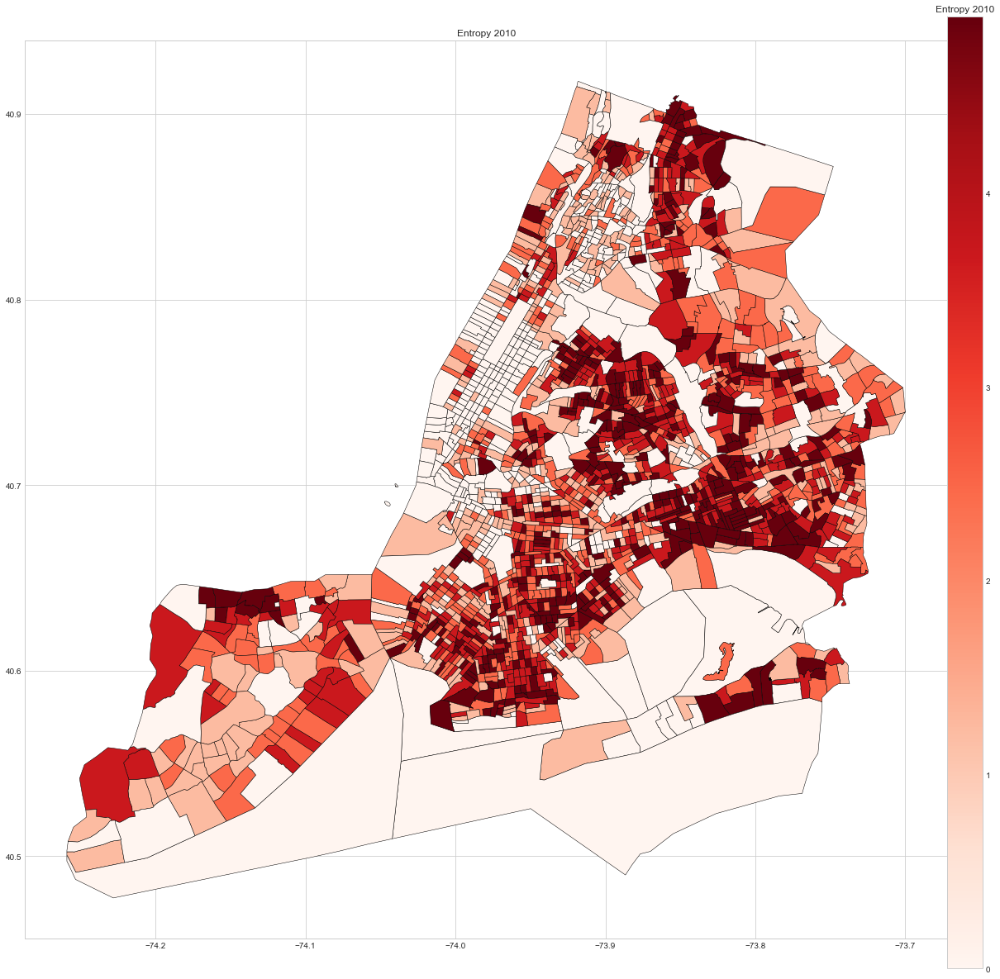

In [313]:
f, ax = plt.subplots(figsize=(20,20))
vmin, vmax = min(gdf['entropy_index_1']) , max(gdf['entropy_index_1'])

ax.get_xaxis().set_visible(True)
ax.get_yaxis().set_visible(True)
gdf.plot(column = 'entropy_index_1', cmap ='Reds', alpha =1, scheme= 'quantiles', linewidth = 0.5, ax = ax, edgecolor='k')
plt.title('Entropy 2010')

fig = ax.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

plt.title('Entropy 2010')

In [314]:
Local_entropy_1 = ps.Moran_Local(entropy_1, rW_CT ,permutations=999)

In [315]:
gdf['e1_significant'] = Local_entropy_1.p_sim < 0.05
gdf['e1_quadrant'] = Local_entropy_1.q

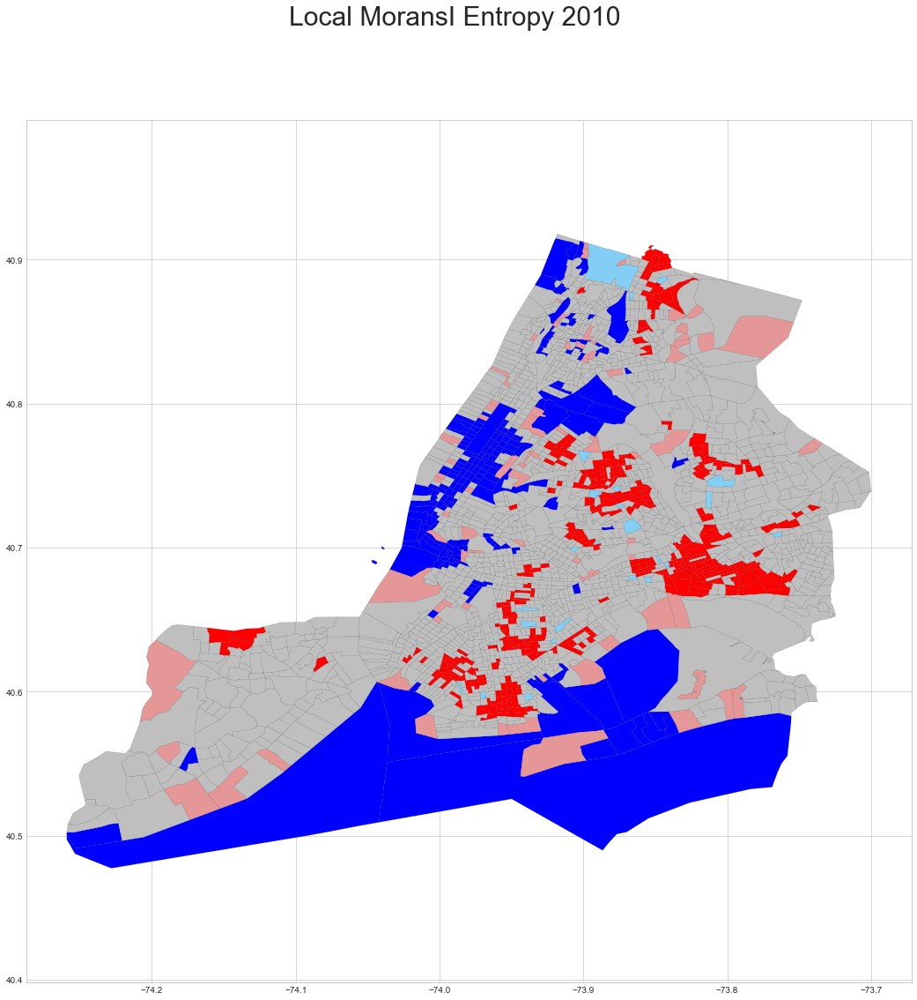

In [316]:
# Setup the figure and axis
f, ax = plt.subplots(1, figsize=(18, 18))
# Plot HH clusters
hh = gdf.loc[(gdf['e1_quadrant']==1) & (gdf['e1_significant']==True), 'geometry']

hh.plot(ax=ax, color='red', linewidth=0.1, edgecolor='k', label = 'HH')
# Plot LL clusters
ll = gdf.loc[(gdf['e1_quadrant']==3) & (gdf['e1_significant']==True), 'geometry']
ll.plot(ax=ax, color='blue', linewidth=0.1, edgecolor='k', label = 'LL')
# Plot LH clusters
lh = gdf.loc[(gdf['e1_quadrant']==2) & (gdf['e1_significant']==True), 'geometry']
lh.plot(ax=ax, color='#83cef4', linewidth=0.1, edgecolor='k', label = 'LH')
# Plot HL clusters
hl = gdf.loc[(gdf['e1_quadrant']==4) & (gdf['e1_significant']==True), 'geometry']
hl.plot(ax=ax, color='#e59696', linewidth=0.1, edgecolor='k', label ='HL')
# Non-significant
ns = gdf.loc[gdf['e1_significant']!=True, 'geometry']
ns.plot(ax=ax, color='0.75', linewidth=0.1, edgecolor='k', label = 'insignificant')
# Style and draw
f.suptitle('Local MoransI Entropy 2010', size=30)
f.set_facecolor('1')


plt.axis('equal')
plt.show()

In [317]:
import seaborn 

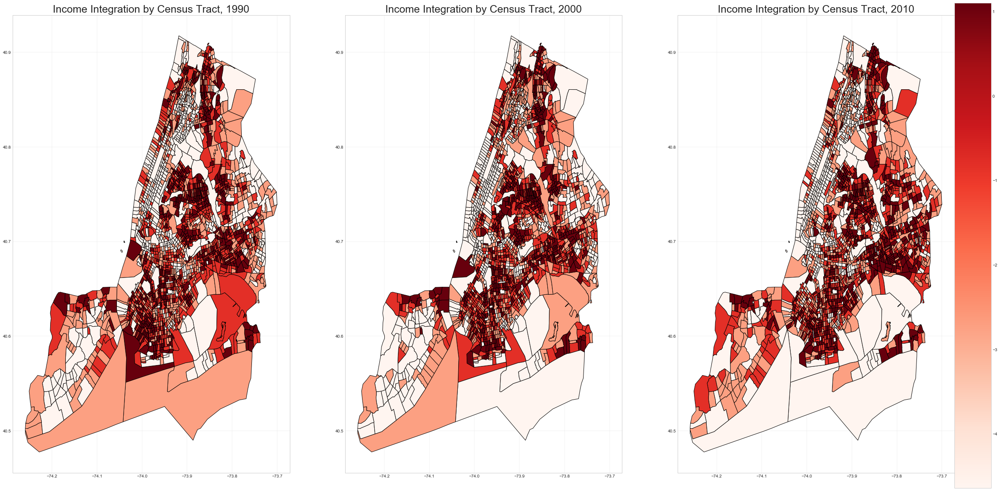

In [340]:
#Now plot it! 
fig = plt.figure(figsize = (40,20))
seaborn.set_style("whitegrid")

ax1 = fig.add_subplot(131)
gdf.plot(ax=ax1, color='black', linewidth=1, alpha=0.1)
gdf.plot(ax=ax1, column='entropy_index_9', cmap='Reds', scheme='quantiles', k=4, edgecolor='k');
plt.title('Income Integration by Census Tract, 1990', size=25)
plt.grid(linewidth=0.25)
plt.legend(fontsize=25)

ax2 = fig.add_subplot(132)
gdf.plot(ax=ax2, color='black', linewidth=1, alpha=0.1)
gdf.plot(ax=ax2, column='entropy_index_0', cmap='Reds', scheme='quantiles', k=4, edgecolor='k');
plt.title('Income Integration by Census Tract, 2000', size=25)
plt.grid(linewidth=0.25)

ax3 = fig.add_subplot(133)
gdf.plot(ax=ax3, color='black', linewidth=1, alpha=0.1)
gdf.plot(ax=ax3, column='entropy_index_1', cmap='Reds', scheme='quantiles', k=4, edgecolor='k');
plt.title('Income Integration by Census Tract, 2010', size=25)
plt.grid(linewidth=0.25)


fig = ax3.get_figure()
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

vmin, vmax = min(gdf['entropy_index_9']) , max(gdf['entropy_index_9'])


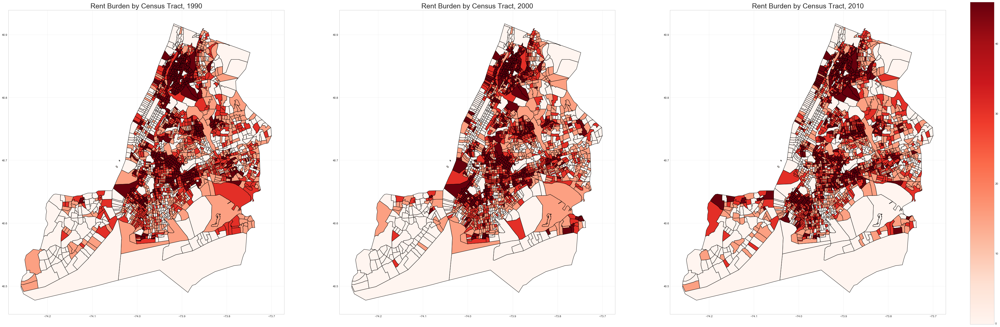

In [350]:
#Now plot it!w
fig = plt.figure(figsize = (60,20))
seaborn.set_style("whitegrid")

ax1 = fig.add_subplot(131)
gdf.plot(ax=ax1, color='black', linewidth=1, alpha=0.1)
gdf.plot(ax=ax1, column='ratio_rent_inc_9', cmap='Reds', scheme='quantiles', k=4, edgecolor='k');
plt.title('Rent Burden by Census Tract, 1990', size=25)
plt.grid(linewidth=0.25)
plt.legend(fontsize=25)

ax2 = fig.add_subplot(132)
gdf.plot(ax=ax2, color='black', linewidth=1, alpha=0.1)
gdf.plot(ax=ax2, column='ratio_rent_inc_0', cmap='Reds', scheme='quantiles', k=4, edgecolor='k');
plt.title('Rent Burden by Census Tract, 2000', size=25)
plt.grid(linewidth=0.25)

ax3 = fig.add_subplot(133)
gdf.plot(ax=ax3, color='black', linewidth=1, alpha=0.1)
gdf.plot(ax=ax3, column='ratio_rent_inc_1', cmap='Reds', scheme='quantiles', k=4, edgecolor='k');
plt.title('Rent Burden by Census Tract, 2010', size=25)
plt.grid(linewidth=0.25)


fig = ax3.get_figure()
cax = fig.add_axes([0.92, 0.1, 0.02, 0.8])
sm = plt.cm.ScalarMappable(cmap='Reds', norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
fig.colorbar(sm, cax=cax)

vmin, vmax = min(gdf['ratio_rent_inc_9']) , max(gdf['ratio_rent_inc_9'])

In [ ]:
fig = plt.figure(figsize = (40,20))
seaborn.set_style("whitegrid")

# Setup the figure and axis
ax1 = plt.subplots(1, figsize=(18, 18))
# Plot HH clusters
hh = gdf.loc[(gdf['quadrant']==1) & (gdf['significant']==True), 'geometry']

hh.plot(ax=ax, color='red', linewidth=0.1, edgecolor='k', label = 'HH')
# Plot LL clusters
ll = gdf.loc[(gdf['quadrant']==3) & (gdf['significant']==True), 'geometry']
ll.plot(ax=ax, color='blue', linewidth=0.1, edgecolor='k', label = 'LL')
# Plot LH clusters
lh = gdf.loc[(gdf['quadrant']==2) & (gdf['significant']==True), 'geometry']
lh.plot(ax=ax, color='#83cef4', linewidth=0.1, edgecolor='k', label = 'LH')
# Plot HL clusters
hl = gdf.loc[(gdf['quadrant']==4) & (gdf['significant']==True), 'geometry']
hl.plot(ax=ax, color='#e59696', linewidth=0.1, edgecolor='k', label ='HL')
# Non-significant
ns = gdf.loc[gdf['significant']!=True, 'geometry']
ns.plot(ax=ax, color='0.75', linewidth=0.1, edgecolor='k', label = 'insignificant')
# Style and draw
f.suptitle('Local MoransI rentburden 1990', size=30)
f.set_facecolor('1')


plt.axis('equal')
plt.show()